In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import os
import seaborn as sns
import warnings
from IPython.display import display # For styled pandas tables

In [2]:
# Set style for publication-quality plots
sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

# Define paths
data_path = "/Users/valar/Documents/Projects/MRI-TAVI-Cytokines/data"
results_path = "/Users/valar/Documents/Projects/MRI-TAVI-Cytokines/results"

# Read the data files
clinical_df = pd.read_csv(f"{data_path}/MRI-TAVI_Clinical.tsv", sep='\t')
mri_df = pd.read_csv(f"{data_path}/MRI-TAVI_Readings.tsv", sep='\t')
cytokines_df = pd.read_csv(f"{data_path}/MRI-TAVI-Jane-Cytokines.tsv", sep='\t')

# Remove ST11 from all dataframes
clinical_df = clinical_df[clinical_df['Subject'] != 'ST11'].copy()
mri_df = mri_df[mri_df['Subject'] != 'ST11'].copy()
cytokines_df = cytokines_df[cytokines_df['Subject'] != 'ST11'].copy()

# Reset indices
clinical_df.reset_index(drop=True, inplace=True)
mri_df.reset_index(drop=True, inplace=True)
cytokines_df.reset_index(drop=True, inplace=True)

# Verify the filtering worked
print("Data loaded and ST11 removed:")
print(f"Clinical data: {clinical_df.shape[0]} patients")
print(f"MRI data: {mri_df.shape[0]} patients")
print(f"Cytokines data: {cytokines_df.shape[0]} observations (should be 40 = 10 patients × 4 timepoints)")
print(f"\nPatients included: {sorted(clinical_df['Subject'].tolist())}")

Data loaded and ST11 removed:
Clinical data: 10 patients
MRI data: 10 patients
Cytokines data: 40 observations (should be 40 = 10 patients × 4 timepoints)

Patients included: ['ST01', 'ST03', 'ST04', 'ST05', 'ST14', 'ST20', 'ST21', 'ST22', 'ST23', 'ST24']


# Step 1: Clinical Summary Table 

In [3]:
# Calculate summary statistics
n_patients = len(clinical_df)

# Age statistics
age_mean = clinical_df['Age'].mean()
age_std = clinical_df['Age'].std()
age_min = clinical_df['Age'].min()
age_max = clinical_df['Age'].max()

# Sex distribution
sex_counts = clinical_df['Sex'].value_counts()
n_male = sex_counts.get('M', 0)
n_female = sex_counts.get('F', 0)
pct_male = (n_male / n_patients) * 100
pct_female = (n_female / n_patients) * 100

# CFS statistics (median and IQR)
cfs_median = clinical_df['CFS'].median()
cfs_q1 = clinical_df['CFS'].quantile(0.25)
cfs_q3 = clinical_df['CFS'].quantile(0.75)

# ACE-3 statistics (mean and range)
# Note: There might be missing values
ace3_mean = clinical_df['ACE-3'].mean()
ace3_min = clinical_df['ACE-3'].min()
ace3_max = clinical_df['ACE-3'].max()
ace3_missing = clinical_df['ACE-3'].isna().sum()

# Create the summary table
summary_data = {
    'Characteristic': [
        'N (participants)',
        'Age (mean ± SD)',
        'Sex (M/F)',
        'CFS (median [IQR])',
        'ACE-3 (mean [range])'
    ],
    'Value': [
        f'{n_patients}',
        f'{age_mean:.1f} years (range {age_min}–{age_max})',
        f'{n_male} M ({pct_male:.0f}%) / {n_female} F ({pct_female:.0f}%)',
        f'{cfs_median:.0f} [{cfs_q1:.0f}–{cfs_q3:.0f}]',
        f'{ace3_mean:.1f} [{ace3_min:.0f}–{ace3_max:.0f}]' if ace3_missing == 0 else f'{ace3_mean:.1f} [{ace3_min:.0f}–{ace3_max:.0f}] (n={n_patients - ace3_missing})'
    ]
}

table1_df = pd.DataFrame(summary_data)

# Display the table
print("\n" + "="*80)
print("TABLE 1: Summary Statistics for Study Cohort (N = 10)")
print("="*80)
print(table1_df.to_string(index=False))
print("="*80)

# Save the table to CSV
table1_df.to_csv(f"{results_path}/Table1_Clinical_Summary.csv", index=False)
print(f"\nTable saved to: {results_path}/Table1_Clinical_Summary.csv")

# Also show detailed breakdown for verification
print("\n" + "="*80)
print("DETAILED BREAKDOWN FOR VERIFICATION")
print("="*80)
print(f"\nAge: Mean={age_mean:.2f}, SD={age_std:.2f}, Range=[{age_min}-{age_max}]")
print(f"Sex: Male={n_male}, Female={n_female}")
print(f"CFS: Median={cfs_median}, Q1={cfs_q1}, Q3={cfs_q3}")
print(f"ACE-3: Mean={ace3_mean:.2f}, Min={ace3_min}, Max={ace3_max}, Missing={ace3_missing}")
print(f"\nIndividual patient data:")
print(clinical_df[['Subject', 'Age', 'Sex', 'CFS', 'ACE-3']].to_string(index=False))


TABLE 1: Summary Statistics for Study Cohort (N = 10)
      Characteristic                    Value
    N (participants)                       10
     Age (mean ± SD) 80.6 years (range 76–88)
           Sex (M/F)    6 M (60%) / 4 F (40%)
  CFS (median [IQR])                  4 [4–5]
ACE-3 (mean [range])       88.9 [65–99] (n=9)

Table saved to: /Users/valar/Documents/Projects/MRI-TAVI-Cytokines/results/Table1_Clinical_Summary.csv

DETAILED BREAKDOWN FOR VERIFICATION

Age: Mean=80.60, SD=3.69, Range=[76-88]
Sex: Male=6, Female=4
CFS: Median=4.0, Q1=4.0, Q3=4.75
ACE-3: Mean=88.89, Min=65.0, Max=99.0, Missing=1

Individual patient data:
Subject  Age Sex  CFS  ACE-3
   ST01   83   M    4   97.0
   ST03   88   F    5   65.0
   ST04   77   M    4    NaN
   ST05   80   M    4   94.0
   ST14   85   M    5   91.0
   ST20   79   F    5   71.0
   ST21   79   M    3   91.0
   ST22   80   F    4   97.0
   ST23   76   M    2   99.0
   ST24   79   F    4   95.0


# Step 2: Summary Data Plots

## Panel plot + single plots

Created/verified folder: /Users/valar/Documents/Projects/MRI-TAVI-Cytokines/results/Summary

Generating individual figures...
Saved: Fig1_Age_Distribution


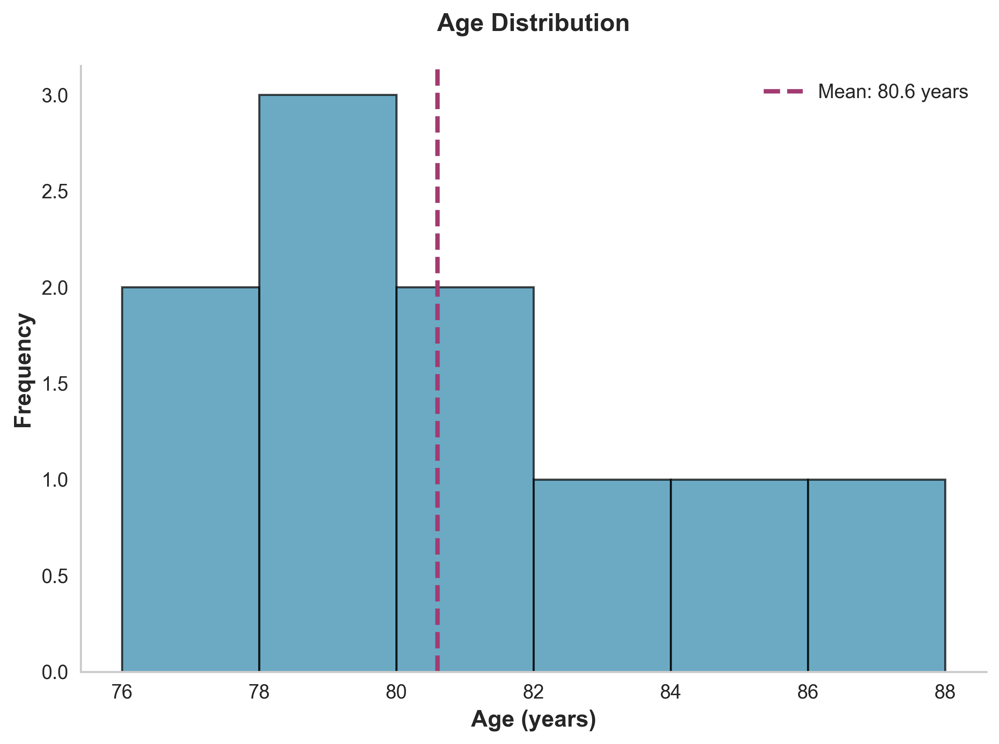

Saved: Fig2_Sex_Distribution


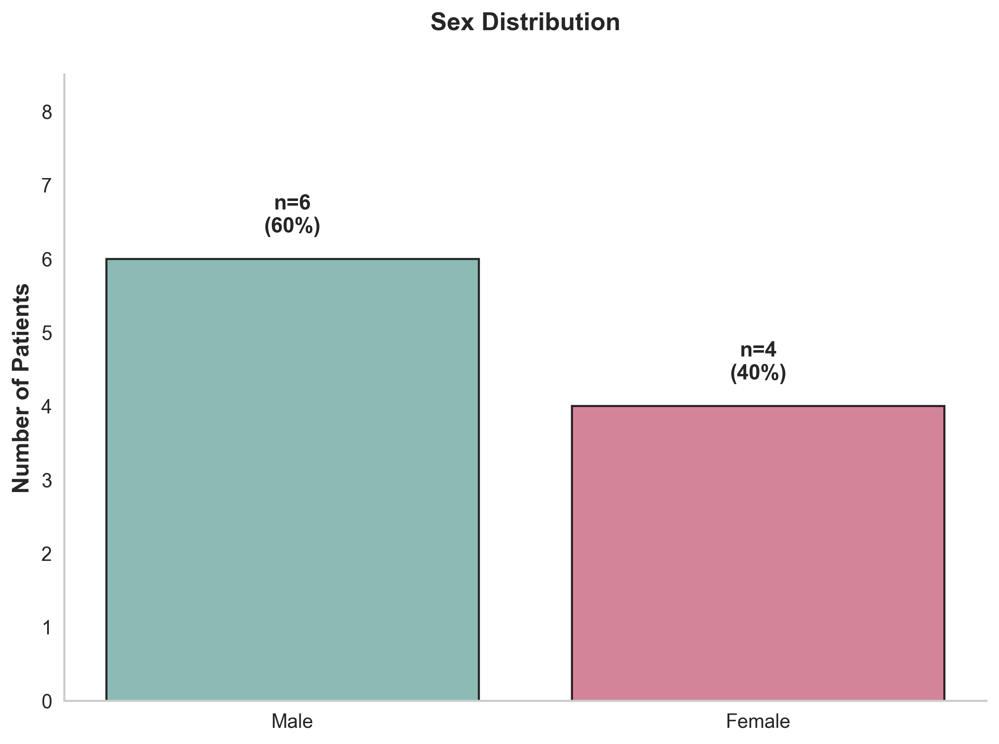

Saved: Fig3_CFS_Distribution


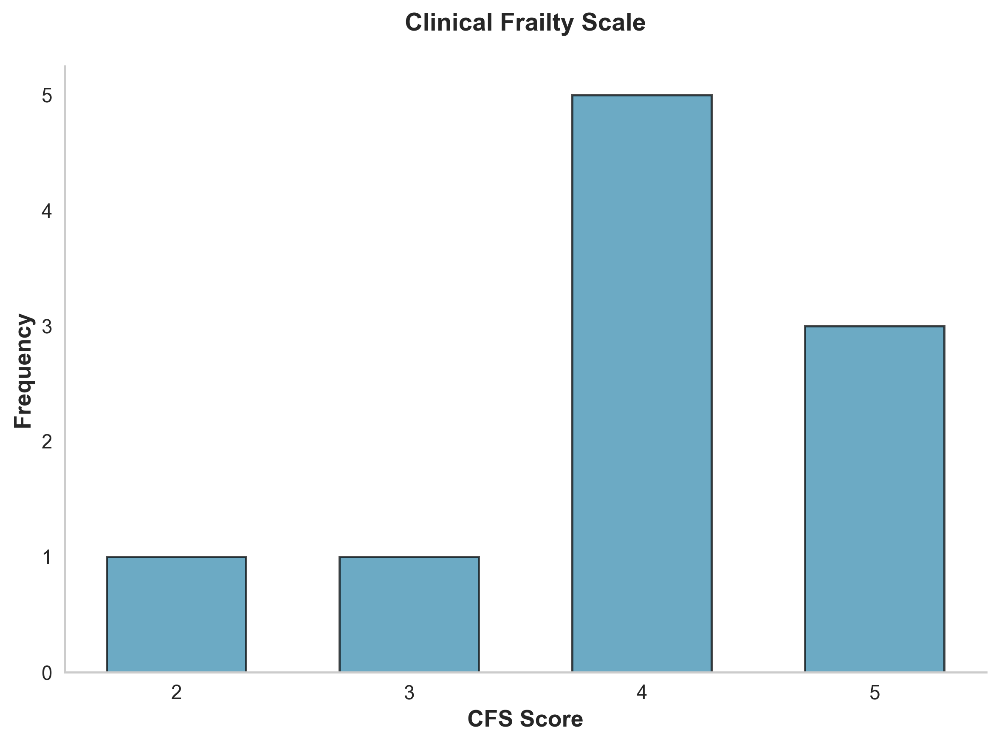

Saved: Fig4_ACE3_Distribution


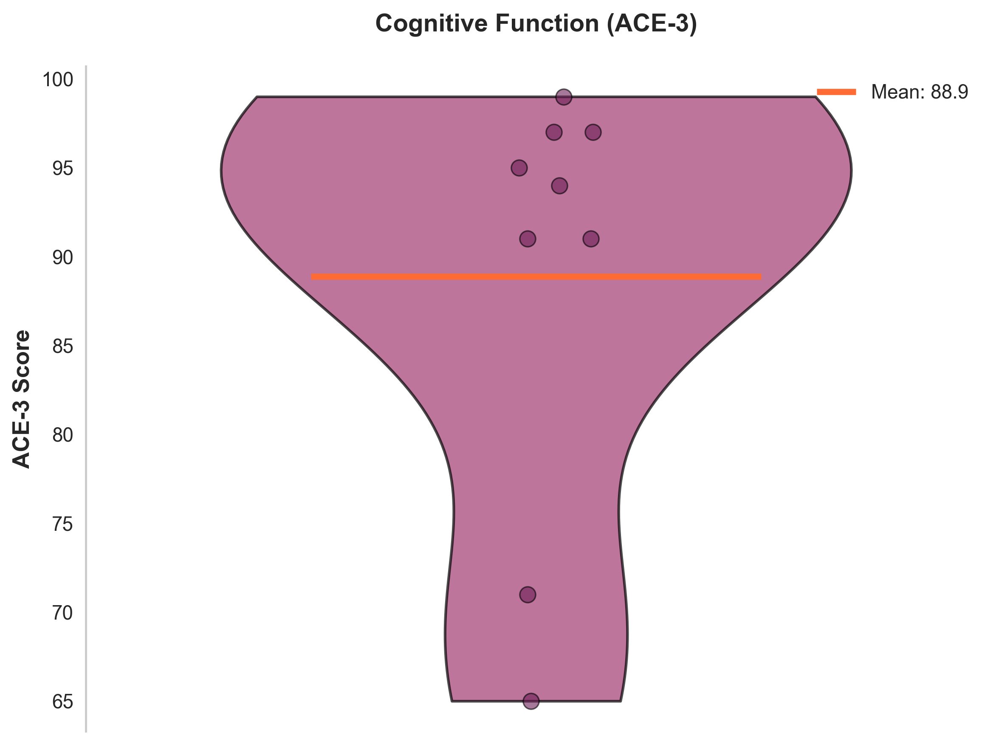

Saved: Fig5_Infarct_Burden


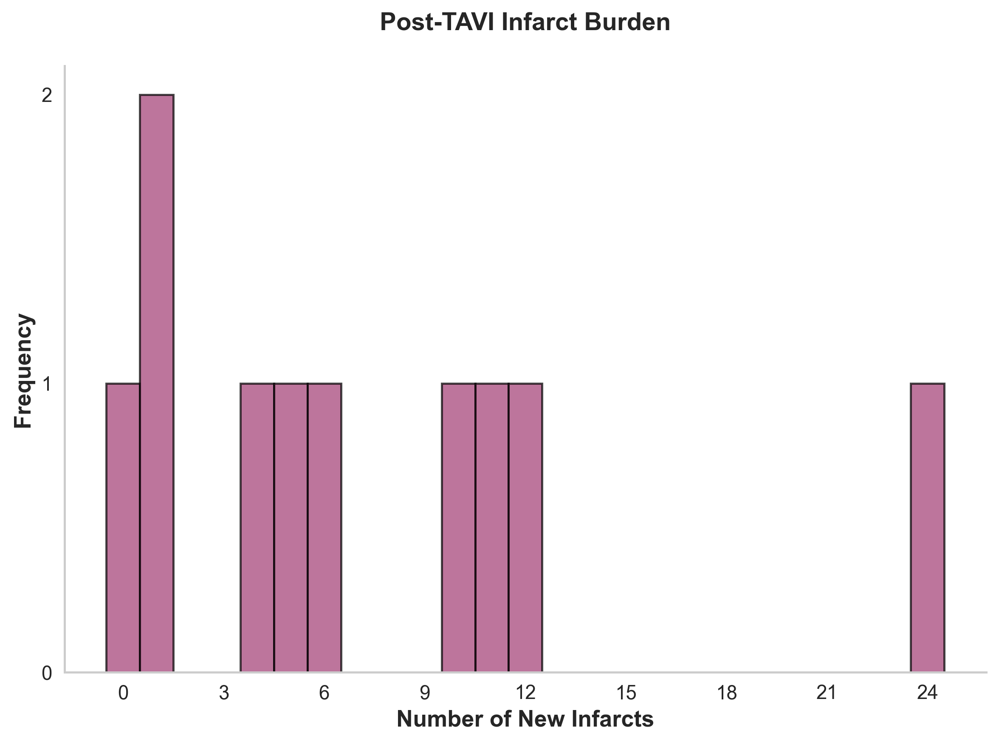

Saved: Fig6_Infarct_Locations


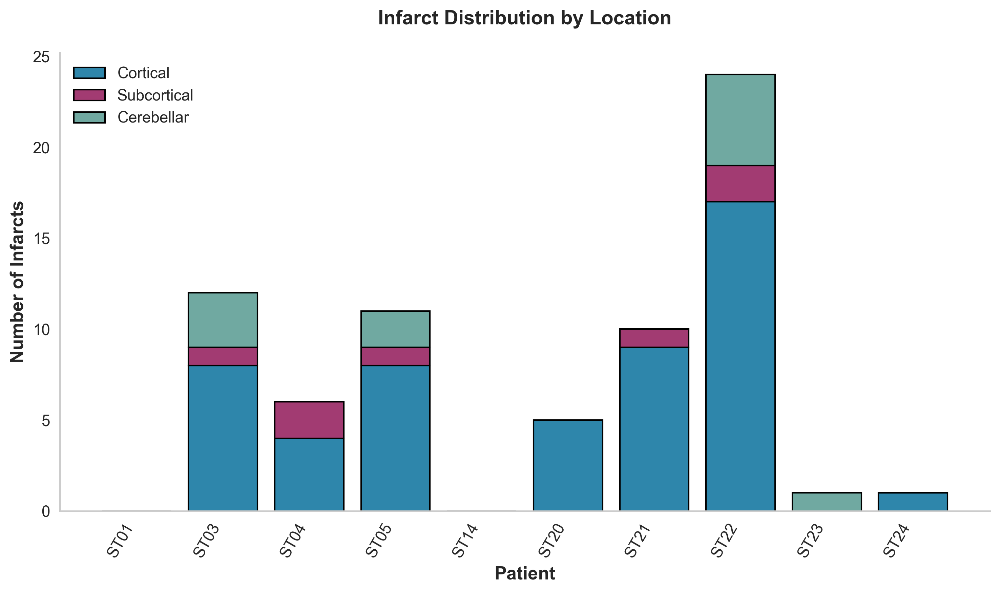


Generating combined panel figure...


/var/folders/zw/yj6r954924g9lyyz7v40_d2h0000gn/T/ipykernel_34702/932766018.py:260: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved: Figure_Combined_Cohort_Summary


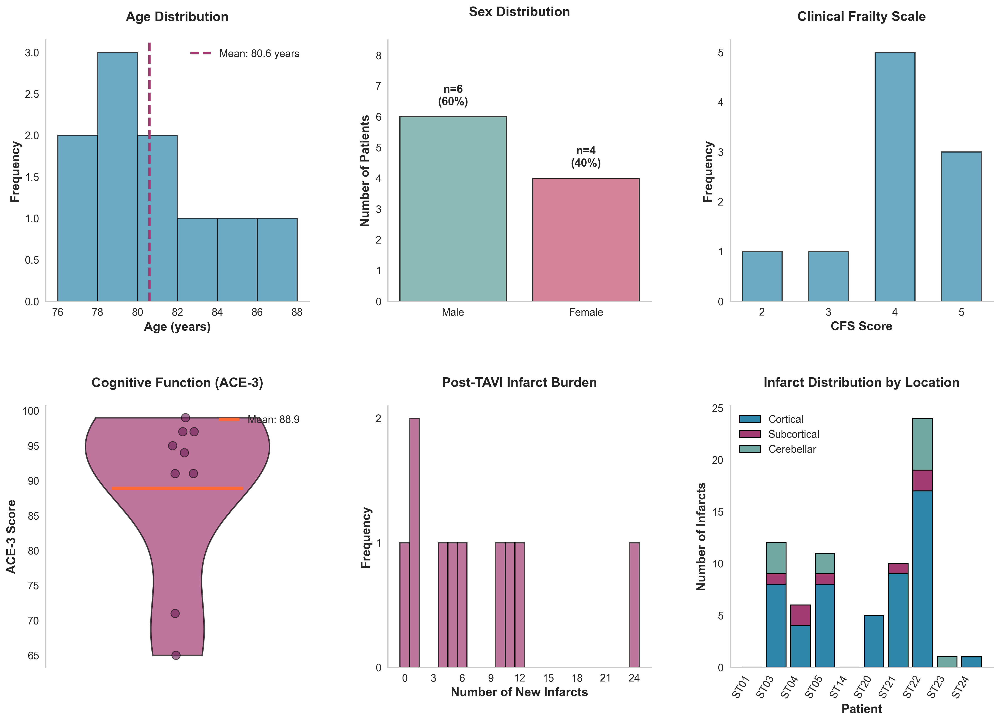


ALL FIGURES SAVED SUCCESSFULLY
Location: /Users/valar/Documents/Projects/MRI-TAVI-Cytokines/results/Summary/

Individual figures:
  - Fig1_Age_Distribution (PNG + PDF)
  - Fig2_Sex_Distribution (PNG + PDF)
  - Fig3_CFS_Distribution (PNG + PDF)
  - Fig4_ACE3_Distribution (PNG + PDF)
  - Fig5_Infarct_Burden (PNG + PDF)
  - Fig6_Infarct_Locations (PNG + PDF)

Combined figure:
  - Figure_Combined_Cohort_Summary (PNG + PDF)


In [6]:
# Set publication-quality style
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial'],
    'axes.labelsize': 13,
    'axes.titlesize': 14,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
    'legend.fontsize': 11,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'axes.linewidth': 1.2,
})

# Define CONSISTENT color palette
color_main = '#2E86AB'  # Professional blue
color_accent = '#A23B72'  # Purple/magenta
color_male = '#70A9A1'  # Teal
color_female = '#CA6680'  # Rose
color_cortical = '#2E86AB'  # Blue
color_subcortical = '#A23B72'  # Purple
color_cerebellar = '#70A9A1'  # Teal

# Create Summary subfolder
summary_path = f"{results_path}/Summary"
os.makedirs(summary_path, exist_ok=True)
print(f"Created/verified folder: {summary_path}\n")

# Set random seed for reproducibility
np.random.seed(42)

# ============================================================================
# HELPER FUNCTION TO CREATE EACH PLOT
# ============================================================================

def plot_age_distribution(ax):
    """Plot age distribution histogram"""
    ages = clinical_df['Age'].values
    ax.hist(ages, bins=6, color=color_main, alpha=0.7, edgecolor='black', linewidth=1.2)
    ax.axvline(ages.mean(), color=color_accent, linestyle='--', linewidth=2.5, 
               label=f'Mean: {ages.mean():.1f} years')
    ax.set_xlabel('Age (years)', fontweight='bold')
    ax.set_ylabel('Frequency', fontweight='bold')
    ax.set_title('Age Distribution', fontweight='bold', pad=20)
    ax.legend(frameon=False, loc='upper right')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(False)

def plot_sex_distribution(ax):
    """Plot sex distribution bar chart"""
    sex_counts = clinical_df['Sex'].value_counts()
    n_male = sex_counts.get('M', 0)
    n_female = sex_counts.get('F', 0)
    total = len(clinical_df)
    pct_male = (n_male / total) * 100
    pct_female = (n_female / total) * 100
    
    bars = ax.bar(['Male', 'Female'], [n_male, n_female], 
                   color=[color_male, color_female], 
                   edgecolor='black', linewidth=1.2, alpha=0.8)
    ax.set_ylabel('Number of Patients', fontweight='bold')
    ax.set_title('Sex Distribution', fontweight='bold', pad=25)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_ylim(0, max(n_male, n_female) + 2.5)
    ax.grid(False)
    
    # Add percentage labels on bars
    for i, (bar, count, pct) in enumerate(zip(bars, [n_male, n_female], [pct_male, pct_female])):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.3,
                 f'n={int(count)}\n({pct:.0f}%)',
                 ha='center', va='bottom', fontweight='bold', fontsize=12)

def plot_cfs_distribution(ax):
    """Plot CFS distribution bar chart"""
    cfs_data = clinical_df['CFS'].values
    cfs_counts = pd.Series(cfs_data).value_counts().sort_index()
    
    bars = ax.bar(cfs_counts.index, cfs_counts.values, color=color_main, 
                  alpha=0.7, edgecolor='black', linewidth=1.2, width=0.6)
    
    ax.set_xlabel('CFS Score', fontweight='bold')
    ax.set_ylabel('Frequency', fontweight='bold')
    ax.set_title('Clinical Frailty Scale', fontweight='bold', pad=20)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(False)
    ax.yaxis.set_major_locator(plt.MaxNLocator(integer=True))
    ax.set_xticks(cfs_counts.index)

def plot_ace3_distribution(ax):
    """Plot ACE-3 violin plot"""
    ace3_data = clinical_df['ACE-3'].dropna().values
    
    # Create violin plot
    parts = ax.violinplot([ace3_data], positions=[0], widths=0.7,
                            showmeans=False, showmedians=False, showextrema=False)
    for pc in parts['bodies']:
        pc.set_facecolor(color_accent)
        pc.set_alpha(0.7)
        pc.set_edgecolor('black')
        pc.set_linewidth(1.5)
    
    # Add individual points with jitter
    jitter = np.random.normal(0, 0.04, size=len(ace3_data))
    ax.scatter(jitter, ace3_data, alpha=0.6, s=80, color='#6B1E55', 
               edgecolors='black', linewidth=0.8, zorder=3)
    
    # Add mean line
    mean_val = np.mean(ace3_data)
    ax.hlines(mean_val, -0.25, 0.25, colors='#FF6B35', linewidth=3.5, zorder=4, 
              label=f'Mean: {mean_val:.1f}')
    
    ax.set_ylabel('ACE-3 Score', fontweight='bold')
    ax.set_title('Cognitive Function (ACE-3)', fontweight='bold', pad=20)
    ax.set_xticks([])
    ax.set_xlim(-0.5, 0.5)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.legend(frameon=False, loc='upper right')
    ax.grid(False)

def plot_infarct_burden(ax):
    """Plot infarct burden histogram with 1-unit bins"""
    infarct_counts = mri_df['POST_Number of new acute infarcts'].values
    
    # Create 1-unit bins
    bins = np.arange(-0.5, max(infarct_counts) + 1.5, 1)
    n, bins_result, patches = ax.hist(infarct_counts, bins=bins, color=color_accent, alpha=0.7, 
                                      edgecolor='black', linewidth=1.2)
    
    ax.set_xlabel('Number of New Infarcts', fontweight='bold')
    ax.set_ylabel('Frequency', fontweight='bold')
    ax.set_title('Post-TAVI Infarct Burden', fontweight='bold', pad=20)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(False)
    ax.yaxis.set_major_locator(plt.MaxNLocator(integer=True))
    ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))

def plot_infarct_locations(ax):
    """Plot infarct location stacked bar chart"""
    cortical = mri_df['POST_New supratentorial infarcts - cortical (number)'].values
    subcortical = mri_df['POST_New supratentorial infarcts - subcortical (number)'].values
    cerebellar = mri_df['POST_New Infarcts - Cerebellum (number)'].values
    
    subjects = mri_df['Subject'].values
    x_pos = np.arange(len(subjects))
    
    p1 = ax.bar(x_pos, cortical, color=color_cortical, edgecolor='black', 
                linewidth=1, label='Cortical')
    p2 = ax.bar(x_pos, subcortical, bottom=cortical, color=color_subcortical, 
                 edgecolor='black', linewidth=1, label='Subcortical')
    p3 = ax.bar(x_pos, cerebellar, bottom=cortical+subcortical, color=color_cerebellar,
                 edgecolor='black', linewidth=1, label='Cerebellar')
    
    ax.set_xlabel('Patient', fontweight='bold')
    ax.set_ylabel('Number of Infarcts', fontweight='bold')
    ax.set_title('Infarct Distribution by Location', fontweight='bold', pad=20)
    ax.set_xticks(x_pos)
    ax.set_xticklabels(subjects, rotation=60, ha='right', fontsize=11)
    ax.legend(frameon=False, loc='upper left', fontsize=11)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(False)

# ============================================================================
# GENERATE INDIVIDUAL FIGURES
# ============================================================================
print("Generating individual figures...")

# Figure 1: Age Distribution
fig1, ax1 = plt.subplots(figsize=(8, 6))
plot_age_distribution(ax1)
plt.tight_layout()
plt.savefig(f'{summary_path}/Fig1_Age_Distribution.png', dpi=300, bbox_inches='tight')
print("Saved: Fig1_Age_Distribution")
plt.show()

# Figure 2: Sex Distribution
fig2, ax2 = plt.subplots(figsize=(8, 6))
plot_sex_distribution(ax2)
plt.tight_layout()
plt.savefig(f'{summary_path}/Fig2_Sex_Distribution.png', dpi=300, bbox_inches='tight')
print("Saved: Fig2_Sex_Distribution")
plt.show()

# Figure 3: CFS Distribution
fig3, ax3 = plt.subplots(figsize=(8, 6))
plot_cfs_distribution(ax3)
plt.tight_layout()
plt.savefig(f'{summary_path}/Fig3_CFS_Distribution.png', dpi=300, bbox_inches='tight')
print("Saved: Fig3_CFS_Distribution")
plt.show()

# Figure 4: ACE-3 Distribution
np.random.seed(42)  # Reset seed for consistency
fig4, ax4 = plt.subplots(figsize=(8, 6))
plot_ace3_distribution(ax4)
plt.tight_layout()
plt.savefig(f'{summary_path}/Fig4_ACE3_Distribution.png', dpi=300, bbox_inches='tight')
print("Saved: Fig4_ACE3_Distribution")
plt.show()

# Figure 5: Infarct Burden
fig5, ax5 = plt.subplots(figsize=(8, 6))
plot_infarct_burden(ax5)
plt.tight_layout()
plt.savefig(f'{summary_path}/Fig5_Infarct_Burden.png', dpi=300, bbox_inches='tight')
print("Saved: Fig5_Infarct_Burden")
plt.show()

# Figure 6: Infarct Locations
fig6, ax6 = plt.subplots(figsize=(10, 6))
plot_infarct_locations(ax6)
plt.tight_layout()
plt.savefig(f'{summary_path}/Fig6_Infarct_Locations.png', dpi=300, bbox_inches='tight')
print("Saved: Fig6_Infarct_Locations")
plt.show()

# ============================================================================
# GENERATE COMBINED PANEL FIGURE
# ============================================================================
print("\nGenerating combined panel figure...")

# Create figure with 2x3 grid
fig_combined = plt.figure(figsize=(18, 12))
gs = GridSpec(2, 3, figure=fig_combined, hspace=0.4, wspace=0.3)

# Panel 1: Age Distribution
ax_panel1 = fig_combined.add_subplot(gs[0, 0])
plot_age_distribution(ax_panel1)

# Panel 2: Sex Distribution
ax_panel2 = fig_combined.add_subplot(gs[0, 1])
plot_sex_distribution(ax_panel2)

# Panel 3: CFS Distribution
ax_panel3 = fig_combined.add_subplot(gs[0, 2])
plot_cfs_distribution(ax_panel3)

# Panel 4: ACE-3 Distribution
np.random.seed(42)  # Reset seed for consistency
ax_panel4 = fig_combined.add_subplot(gs[1, 0])
plot_ace3_distribution(ax_panel4)

# Panel 5: Infarct Burden
ax_panel5 = fig_combined.add_subplot(gs[1, 1])
plot_infarct_burden(ax_panel5)

# Panel 6: Infarct Locations
ax_panel6 = fig_combined.add_subplot(gs[1, 2])
plot_infarct_locations(ax_panel6)

plt.tight_layout()
plt.savefig(f'{summary_path}/Figure_Combined_Cohort_Summary.png', dpi=300, bbox_inches='tight')
print("Saved: Figure_Combined_Cohort_Summary")
plt.show()

# ============================================================================
# Print summary
# ============================================================================
print("\n" + "="*80)
print("ALL FIGURES SAVED SUCCESSFULLY")
print("="*80)
print(f"Location: {summary_path}/")
print("\nIndividual figures:")
print("  - Fig1_Age_Distribution (PNG + PDF)")
print("  - Fig2_Sex_Distribution (PNG + PDF)")
print("  - Fig3_CFS_Distribution (PNG + PDF)")
print("  - Fig4_ACE3_Distribution (PNG + PDF)")
print("  - Fig5_Infarct_Burden (PNG + PDF)")
print("  - Fig6_Infarct_Locations (PNG + PDF)")
print("\nCombined figure:")
print("  - Figure_Combined_Cohort_Summary (PNG + PDF)")

## Alternative panel (to be confirmed)

/var/folders/zw/yj6r954924g9lyyz7v40_d2h0000gn/T/ipykernel_34702/3848405712.py:195: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()



Figure saved to:
  - /Users/valar/Documents/Projects/MRI-TAVI-Cytokines/results/Summary/Figure1_Cohort_Characteristics_Atlernative.png


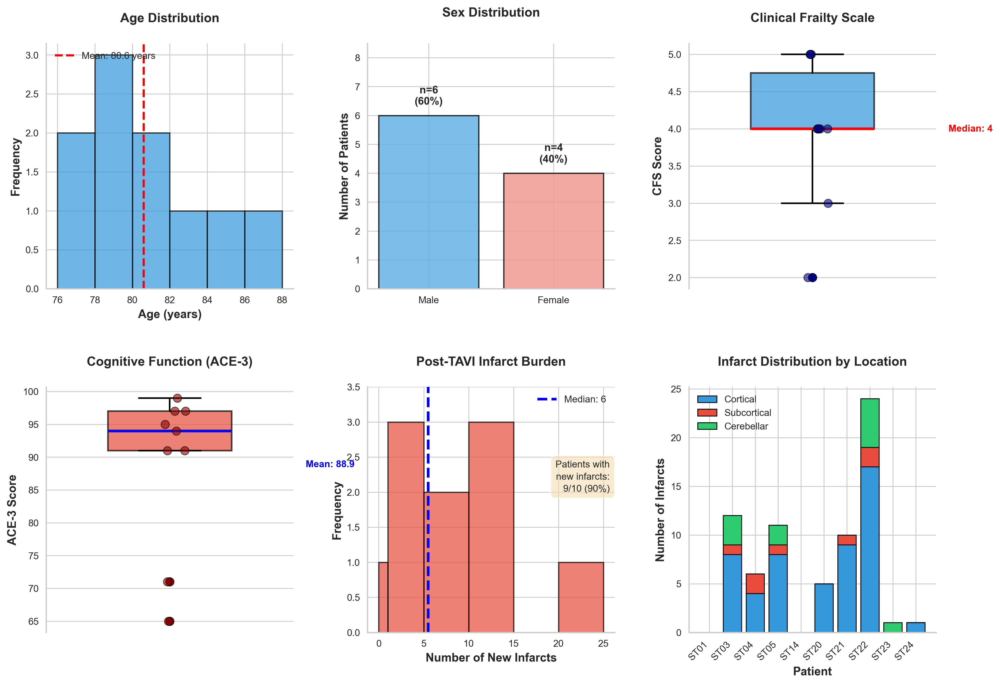


SUMMARY STATISTICS FOR FIGURE 1
Age: 80.6 ± 3.5 years (range: 76-88)
Sex: 6M (60%) / 4F (40%)
CFS: Median=4, IQR=[4-5]
ACE-3: 88.9 ± 11.5 (range: 65-99)
New infarcts: Median=6, Range=[0-24]
Patients with new infarcts: 9/10 (90%)
Total cortical infarcts: 52
Total subcortical infarcts: 7
Total cerebellar infarcts: 11


In [8]:
# Set publication-quality style
plt.rcParams.update({
    'font.size': 10,
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial'],
    'axes.labelsize': 11,
    'axes.titlesize': 12,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.titlesize': 13,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'axes.linewidth': 1.2,
})

# Define color palette
color_primary = '#3498db'  # Blue
color_secondary = '#e74c3c'  # Red
color_male = '#5DADE2'  # Light blue
color_female = '#F1948A'  # Light red/pink
colors_locations = ['#3498db', '#e74c3c', '#2ecc71', '#f39c12']

# Create figure with 2x3 grid
fig = plt.figure(figsize=(15, 10))
gs = GridSpec(2, 3, figure=fig, hspace=0.4, wspace=0.3)

# ============================================================================
# PANEL 1: Age Distribution
# ============================================================================
ax1 = fig.add_subplot(gs[0, 0])
ages = clinical_df['Age'].values
ax1.hist(ages, bins=6, color=color_primary, alpha=0.7, edgecolor='black', linewidth=1.2)
ax1.axvline(ages.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {ages.mean():.1f} years')
ax1.set_xlabel('Age (years)', fontweight='bold')
ax1.set_ylabel('Frequency', fontweight='bold')
ax1.set_title('Age Distribution', fontweight='bold', pad=20)
ax1.legend(frameon=False, loc='upper left')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# ============================================================================
# PANEL 2: Sex Distribution
# ============================================================================
ax2 = fig.add_subplot(gs[0, 1])
sex_counts = clinical_df['Sex'].value_counts()
n_male = sex_counts.get('M', 0)
n_female = sex_counts.get('F', 0)
total = len(clinical_df)
pct_male = (n_male / total) * 100
pct_female = (n_female / total) * 100

bars = ax2.bar(['Male', 'Female'], [n_male, n_female], 
               color=[color_male, color_female], 
               edgecolor='black', linewidth=1.2, alpha=0.8)
ax2.set_ylabel('Number of Patients', fontweight='bold')
ax2.set_title('Sex Distribution', fontweight='bold', pad=25)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.set_ylim(0, max(n_male, n_female) + 2.5)  # More space at top

# Add percentage labels on bars with better positioning
for i, (bar, count, pct) in enumerate(zip(bars, [n_male, n_female], [pct_male, pct_female])):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + 0.3,
             f'n={int(count)}\n({pct:.0f}%)',
             ha='center', va='bottom', fontweight='bold', fontsize=10)

# ============================================================================
# PANEL 3: Clinical Frailty Scale (CFS) - Using Box Plot Instead
# ============================================================================
ax3 = fig.add_subplot(gs[0, 2])
cfs_data = clinical_df['CFS'].values

# Create box plot
bp = ax3.boxplot([cfs_data], positions=[0], widths=0.5, patch_artist=True,
                  boxprops=dict(facecolor=color_primary, alpha=0.7, edgecolor='black', linewidth=1.5),
                  medianprops=dict(color='red', linewidth=2.5),
                  whiskerprops=dict(color='black', linewidth=1.5),
                  capprops=dict(color='black', linewidth=1.5),
                  flierprops=dict(marker='o', markerfacecolor='darkblue', markersize=8, 
                                 markeredgecolor='black', markeredgewidth=0.5))

# Add individual points with jitter
np.random.seed(42)  # For reproducibility
jitter = np.random.normal(0, 0.04, size=len(cfs_data))
ax3.scatter(jitter, cfs_data, alpha=0.6, s=60, color='darkblue', 
           edgecolors='black', linewidth=0.8, zorder=3)

median_val = np.median(cfs_data)
ax3.set_ylabel('CFS Score', fontweight='bold')
ax3.set_title('Clinical Frailty Scale', fontweight='bold', pad=20)
ax3.set_xticks([])
ax3.set_xlim(-0.5, 0.5)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.spines['bottom'].set_visible(False)
# Add median label to the side
ax3.text(0.55, median_val, f'Median: {median_val:.0f}', 
         va='center', fontsize=9, fontweight='bold', color='red')

# ============================================================================
# PANEL 4: ACE-3 Score - Using Box Plot Instead
# ============================================================================
ax4 = fig.add_subplot(gs[1, 0])
ace3_data = clinical_df['ACE-3'].dropna().values

# Create box plot
bp = ax4.boxplot([ace3_data], positions=[0], widths=0.5, patch_artist=True,
                  boxprops=dict(facecolor=color_secondary, alpha=0.7, edgecolor='black', linewidth=1.5),
                  medianprops=dict(color='blue', linewidth=2.5),
                  whiskerprops=dict(color='black', linewidth=1.5),
                  capprops=dict(color='black', linewidth=1.5),
                  flierprops=dict(marker='o', markerfacecolor='darkred', markersize=8,
                                 markeredgecolor='black', markeredgewidth=0.5))

# Add individual points with jitter
np.random.seed(42)
jitter = np.random.normal(0, 0.04, size=len(ace3_data))
ax4.scatter(jitter, ace3_data, alpha=0.6, s=60, color='darkred', 
           edgecolors='black', linewidth=0.8, zorder=3)

mean_val = np.mean(ace3_data)
ax4.set_ylabel('ACE-3 Score', fontweight='bold')
ax4.set_title('Cognitive Function (ACE-3)', fontweight='bold', pad=20)
ax4.set_xticks([])
ax4.set_xlim(-0.5, 0.5)
ax4.spines['top'].set_visible(False)
ax4.spines['right'].set_visible(False)
ax4.spines['bottom'].set_visible(False)
# Add mean label to the side
ax4.text(0.55, mean_val, f'Mean: {mean_val:.1f}', 
         va='center', fontsize=9, fontweight='bold', color='blue')

# ============================================================================
# PANEL 5: New Infarct Burden Distribution
# ============================================================================
ax5 = fig.add_subplot(gs[1, 1])
infarct_counts = mri_df['POST_Number of new acute infarcts'].values
bins = [0, 1, 5, 10, 15, 20, 25]
ax5.hist(infarct_counts, bins=bins, color=color_secondary, alpha=0.7, 
         edgecolor='black', linewidth=1.2)
median_infarcts = np.median(infarct_counts)
ax5.axvline(median_infarcts, color='blue', linestyle='--', 
            linewidth=2.5, label=f'Median: {median_infarcts:.0f}')
ax5.set_xlabel('Number of New Infarcts', fontweight='bold')
ax5.set_ylabel('Frequency', fontweight='bold')
ax5.set_title('Post-TAVI Infarct Burden', fontweight='bold', pad=20)
ax5.legend(frameon=False, loc='upper right')
ax5.spines['top'].set_visible(False)
ax5.spines['right'].set_visible(False)
ax5.set_ylim(0, 3.5)  # Add more space at top

# Add statistics text box with better positioning
n_with_infarcts = np.sum(infarct_counts > 0)
pct_with_infarcts = (n_with_infarcts / len(infarct_counts)) * 100
ax5.text(0.98, 0.70, f'Patients with\nnew infarcts:\n{n_with_infarcts}/{len(infarct_counts)} ({pct_with_infarcts:.0f}%)',
         transform=ax5.transAxes, ha='right', va='top', 
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.6, pad=0.5), 
         fontsize=9, linespacing=1.5)

# ============================================================================
# PANEL 6: Infarct Location Distribution
# ============================================================================
ax6 = fig.add_subplot(gs[1, 2])

# Extract location data
cortical = mri_df['POST_New supratentorial infarcts - cortical (number)'].values
subcortical = mri_df['POST_New supratentorial infarcts - subcortical (number)'].values
cerebellar = mri_df['POST_New Infarcts - Cerebellum (number)'].values

# Create stacked bar chart
subjects = mri_df['Subject'].values
x_pos = np.arange(len(subjects))

p1 = ax6.bar(x_pos, cortical, color=colors_locations[0], edgecolor='black', linewidth=0.8, label='Cortical')
p2 = ax6.bar(x_pos, subcortical, bottom=cortical, color=colors_locations[1], 
             edgecolor='black', linewidth=0.8, label='Subcortical')
p3 = ax6.bar(x_pos, cerebellar, bottom=cortical+subcortical, color=colors_locations[2],
             edgecolor='black', linewidth=0.8, label='Cerebellar')

ax6.set_xlabel('Patient', fontweight='bold')
ax6.set_ylabel('Number of Infarcts', fontweight='bold')
ax6.set_title('Infarct Distribution by Location', fontweight='bold', pad=20)
ax6.set_xticks(x_pos)
ax6.set_xticklabels(subjects, rotation=45, ha='right', fontsize=9)
ax6.legend(frameon=False, loc='upper left', fontsize=9)
ax6.spines['top'].set_visible(False)
ax6.spines['right'].set_visible(False)

# ============================================================================
# Save figure
# ============================================================================
plt.tight_layout()
plt.savefig(f'{results_path}/Summary/Figure1_Cohort_Characteristics_Atlernative.png', dpi=300, bbox_inches='tight')
print(f"\nFigure saved to:")
print(f"  - {results_path}/Summary/Figure1_Cohort_Characteristics_Atlernative.png")
plt.show()

# Print summary statistics
print("\n" + "="*80)
print("SUMMARY STATISTICS FOR FIGURE 1")
print("="*80)
print(f"Age: {ages.mean():.1f} ± {ages.std():.1f} years (range: {ages.min()}-{ages.max()})")
print(f"Sex: {n_male}M ({pct_male:.0f}%) / {n_female}F ({pct_female:.0f}%)")
print(f"CFS: Median={np.median(cfs_data):.0f}, IQR=[{np.percentile(cfs_data, 25):.0f}-{np.percentile(cfs_data, 75):.0f}]")
print(f"ACE-3: {mean_val:.1f} ± {np.std(ace3_data):.1f} (range: {ace3_data.min():.0f}-{ace3_data.max():.0f})")
print(f"New infarcts: Median={median_infarcts:.0f}, Range=[{infarct_counts.min()}-{infarct_counts.max()}]")
print(f"Patients with new infarcts: {n_with_infarcts}/{len(infarct_counts)} ({pct_with_infarcts:.0f}%)")
print(f"Total cortical infarcts: {cortical.sum():.0f}")
print(f"Total subcortical infarcts: {subcortical.sum():.0f}")
print(f"Total cerebellar infarcts: {cerebellar.sum():.0f}")

# Step 3: Pre VS Post counts

Saved: Pre_vs_Post_Infarcts_by_Fazekas


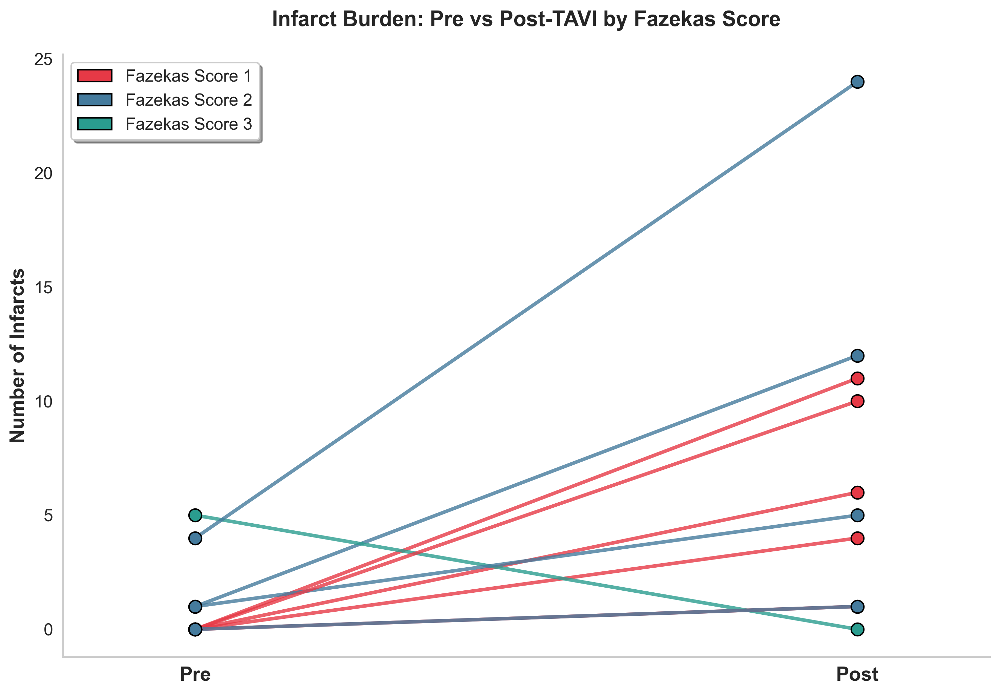

Saved: Change_in_Infarcts_by_Fazekas


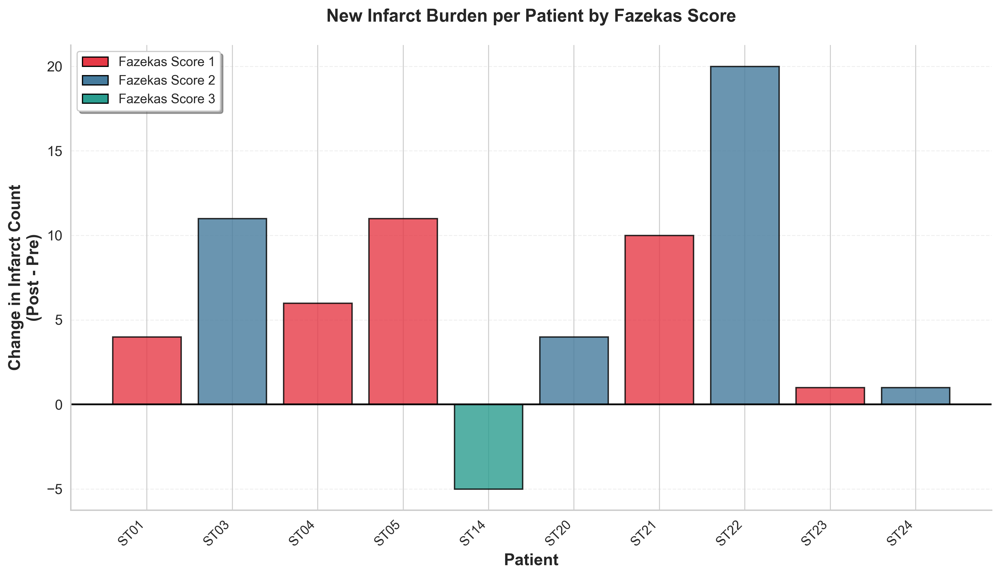

Saved: Boxplot_Pre_vs_Post_by_Fazekas


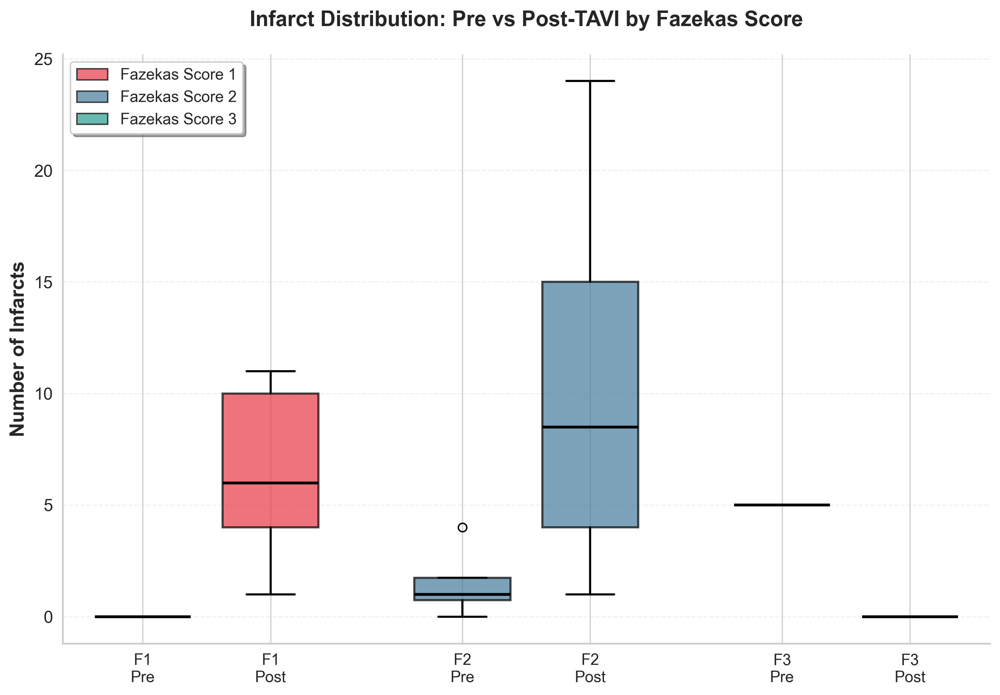

Saved: Radial_Infarct_Change_by_Fazekas (improved)


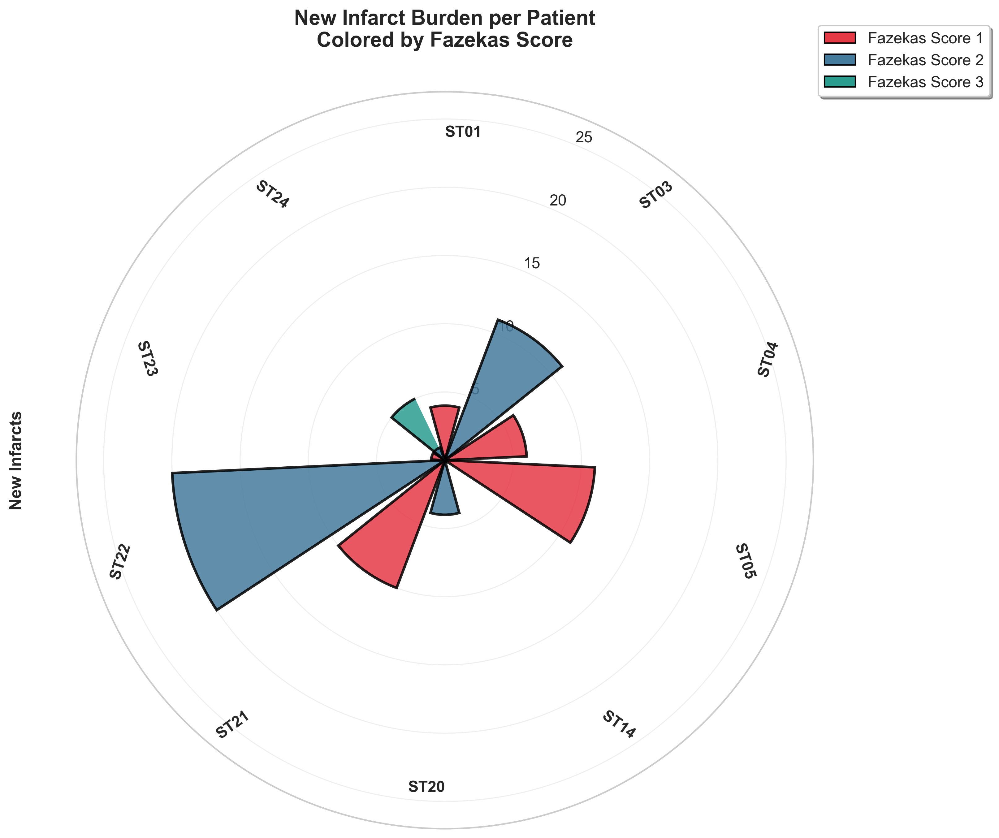


THREE PLOTS CREATED
1. Pre vs Post slope plot (original style with better colors)
2. Bar chart showing change in infarct count per patient
3. Grouped boxplot comparing pre vs post by Fazekas score

All saved in: /Users/valar/Documents/Projects/MRI-TAVI-Cytokines/results/MRI_Analysis/

SUMMARY: PRE vs POST INFARCTS BY FAZEKAS SCORE

Fazekas Score 1 (n=5):
  Pre-TAVI infarcts:  0.0 ± 0.0
  Post-TAVI infarcts: 6.4 ± 3.7
  Mean change: 6.4

Fazekas Score 2 (n=4):
  Pre-TAVI infarcts:  1.5 ± 1.5
  Post-TAVI infarcts: 10.5 ± 8.7
  Mean change: 9.0

Fazekas Score 3 (n=1):
  Pre-TAVI infarcts:  5.0 ± 0.0
  Post-TAVI infarcts: 0.0 ± 0.0
  Mean change: -5.0


In [15]:
import matplotlib.pyplot as plt
import numpy as np
import os

# Create folder
mri_plots_path = f"{results_path}/MRI_Analysis"
os.makedirs(mri_plots_path, exist_ok=True)

# Set style
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial'],
    'axes.labelsize': 13,
    'axes.titlesize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'axes.linewidth': 1.2,
})

# Better, more distinct color palette
fazekas_colors = {
    1: '#E63946',  # Red
    2: '#457B9D',  # Blue  
    3: '#2A9D8F'   # Teal
}

# Extract data
pre_infarcts = mri_df['PRE_Infarcts - Total Number'].values
post_infarcts = mri_df['POST_Number of new acute infarcts'].values
fazekas_scores = mri_df['PRE_SVD Fazekas Score (1,2,3)'].values
subjects = mri_df['Subject'].values

# ============================================================================
# Plot 1: Original style slope plot with better colors
# ============================================================================
fig1, ax1 = plt.subplots(figsize=(10, 7))

# Plot lines for each patient, colored by Fazekas score
for i in range(len(mri_df)):
    fazekas = fazekas_scores[i]
    color = fazekas_colors[fazekas]
    
    # Plot line connecting pre to post
    ax1.plot([0, 1], [pre_infarcts[i], post_infarcts[i]], 
            color=color, linewidth=2.5, alpha=0.8)
    
    # Add markers
    ax1.scatter([0, 1], [pre_infarcts[i], post_infarcts[i]], 
              color=color, s=80, edgecolors='black', linewidth=1, zorder=3)

# Set x-axis
ax1.set_xlim(-0.2, 1.2)
ax1.set_xticks([0, 1])
ax1.set_xticklabels(['Pre', 'Post'], fontsize=14, fontweight='bold')

# Set y-axis
ax1.set_ylabel('Number of Infarcts', fontweight='bold', fontsize=14)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.grid(False)

# Create better legend with colored patches
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor=fazekas_colors[1], edgecolor='black', label='Fazekas Score 1'),
    Patch(facecolor=fazekas_colors[2], edgecolor='black', label='Fazekas Score 2'),
    Patch(facecolor=fazekas_colors[3], edgecolor='black', label='Fazekas Score 3')
]
ax1.legend(handles=legend_elements, loc='upper left', frameon=True, 
          fancybox=True, shadow=True, fontsize=12)

# Set title
ax1.set_title('Infarct Burden: Pre vs Post-TAVI by Fazekas Score', 
            fontweight='bold', pad=20, fontsize=15)

plt.tight_layout()
plt.savefig(f'{mri_plots_path}/Pre_vs_Post_Infarcts_by_Fazekas.png', dpi=300, bbox_inches='tight')
print("Saved: Pre_vs_Post_Infarcts_by_Fazekas")
plt.show()

# ============================================================================
# Plot 2: Change in Infarcts (Bar Chart)
# ============================================================================
fig2, ax2 = plt.subplots(figsize=(12, 7))

# Calculate change
change_infarcts = post_infarcts - pre_infarcts

## Sort by Fazekas score, then by change
#subjects_sorted = subjects[sort_idx]
#sort_idx = np.lexsort((change_infarcts, fazekas_scores))
#fazekas_sorted = fazekas_scores[sort_idx]
#change_sorted = change_infarcts[sort_idx]

# Keep original patient order (ST01, ST03, ST04, etc.)
subjects_sorted = subjects
change_sorted = change_infarcts
fazekas_sorted = fazekas_scores

# Create bar positions
x_pos = np.arange(len(subjects_sorted))

# Color bars by Fazekas score
colors_list = [fazekas_colors[f] for f in fazekas_sorted]

# Plot bars
bars = ax2.bar(x_pos, change_sorted, color=colors_list, 
              edgecolor='black', linewidth=1.2, alpha=0.8)

# Add zero line
ax2.axhline(0, color='black', linewidth=1.5, linestyle='-', zorder=1)

# Styling
ax2.set_xlabel('Patient', fontweight='bold', fontsize=14)
ax2.set_ylabel('Change in Infarct Count\n(Post - Pre)', fontweight='bold', fontsize=14)
ax2.set_title('New Infarct Burden per Patient by Fazekas Score', 
            fontweight='bold', pad=20, fontsize=15)
ax2.set_xticks(x_pos)
ax2.set_xticklabels(subjects_sorted, rotation=45, ha='right', fontsize=11)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.grid(axis='y', alpha=0.3, linestyle='--')

# Create legend
legend_elements = [
    Patch(facecolor=fazekas_colors[1], edgecolor='black', label='Fazekas Score 1'),
    Patch(facecolor=fazekas_colors[2], edgecolor='black', label='Fazekas Score 2'),
    Patch(facecolor=fazekas_colors[3], edgecolor='black', label='Fazekas Score 3')
]
ax2.legend(handles=legend_elements, loc='upper left', frameon=True, 
          fancybox=True, shadow=True, fontsize=11)

plt.tight_layout()
plt.savefig(f'{mri_plots_path}/Change_in_Infarcts_by_Fazekas.png', dpi=300, bbox_inches='tight')
print("Saved: Change_in_Infarcts_by_Fazekas")
plt.show()

# ============================================================================
# Plot 3: Grouped Box Plot
# ============================================================================
fig3, ax3 = plt.subplots(figsize=(10, 7))

# Prepare data for grouped boxplot
data_for_box = []
positions_list = []
colors_list_box = []
labels_list = []

pos = 0
for fazekas in [1, 2, 3]:
    mask = fazekas_scores == fazekas
    if mask.sum() > 0:
        # Pre data
        data_for_box.append(pre_infarcts[mask])
        positions_list.append(pos)
        colors_list_box.append(fazekas_colors[fazekas])
        labels_list.append(f'F{fazekas}\nPre')
        
        # Post data
        data_for_box.append(post_infarcts[mask])
        positions_list.append(pos + 0.8)
        colors_list_box.append(fazekas_colors[fazekas])
        labels_list.append(f'F{fazekas}\nPost')
        
        pos += 2

# Create box plots
bp = ax3.boxplot(data_for_box, positions=positions_list, widths=0.6,
                patch_artist=True, showfliers=True,
                boxprops=dict(linewidth=1.5),
                medianprops=dict(color='black', linewidth=2),
                whiskerprops=dict(linewidth=1.5),
                capprops=dict(linewidth=1.5))

# Color the boxes
for patch, color in zip(bp['boxes'], colors_list_box):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

# Styling
ax3.set_xticks(positions_list)
ax3.set_xticklabels(labels_list, fontsize=11)
ax3.set_ylabel('Number of Infarcts', fontweight='bold', fontsize=14)
ax3.set_title('Infarct Distribution: Pre vs Post-TAVI by Fazekas Score', 
            fontweight='bold', pad=20, fontsize=15)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.grid(axis='y', alpha=0.3, linestyle='--')

# Add legend
legend_elements = [
    Patch(facecolor=fazekas_colors[1], edgecolor='black', alpha=0.7, label='Fazekas Score 1'),
    Patch(facecolor=fazekas_colors[2], edgecolor='black', alpha=0.7, label='Fazekas Score 2'),
    Patch(facecolor=fazekas_colors[3], edgecolor='black', alpha=0.7, label='Fazekas Score 3')
]
ax3.legend(handles=legend_elements, loc='upper left', frameon=True, 
          fancybox=True, shadow=True, fontsize=11)

plt.tight_layout()
plt.savefig(f'{mri_plots_path}/Boxplot_Pre_vs_Post_by_Fazekas.png', dpi=300, bbox_inches='tight')
print("Saved: Boxplot_Pre_vs_Post_by_Fazekas")
plt.show()

# ============================================================================
# Plot 4: Improved Radial Plot - Cleaner Version
# ============================================================================
fig4, ax4 = plt.subplots(figsize=(11, 11), subplot_kw=dict(projection='polar'))

# Calculate angles for each patient
n_patients = len(subjects)
theta = np.linspace(0, 2 * np.pi, n_patients, endpoint=False)

# Get change in infarcts
change_infarcts = post_infarcts - pre_infarcts

# Create bars
bars = ax4.bar(theta, change_infarcts, width=2*np.pi/n_patients*0.85, 
               bottom=0, alpha=0.85, edgecolor='black', linewidth=2)

# Color by Fazekas score
for bar, fazekas in zip(bars, fazekas_scores):
    bar.set_facecolor(fazekas_colors[fazekas])

# Add patient labels around the circle - larger and bolder
for angle, subject, change in zip(theta, subjects, change_infarcts):
    rotation = np.rad2deg(angle)
    # Adjust text rotation for readability
    if 90 < rotation < 270:
        rotation = rotation + 180
        ha = 'right'
    else:
        ha = 'left'
    
    # Position labels outside the plot
    ax4.text(angle, max(change_infarcts) * 1.2, subject, 
            rotation=rotation, ha=ha, va='center', 
            fontweight='bold', fontsize=12)

# CLEAN UP - Remove degree markers and grid
ax4.set_theta_zero_location('N')
ax4.set_theta_direction(-1)
ax4.set_ylim(0, max(change_infarcts) * 1.35)
ax4.set_xticks([])  # Remove angular ticks
ax4.set_xticklabels([])  # Remove angular labels
ax4.grid(True, alpha=0.3)  # Keep only radial grid, make it subtle

# Clean radial axis labels
ax4.set_ylabel('New Infarcts', fontweight='bold', fontsize=13, labelpad=40)

# Title
ax4.set_title('New Infarct Burden per Patient\nColored by Fazekas Score', 
             fontweight='bold', pad=35, fontsize=16)

# Add legend
legend_elements = [
    Patch(facecolor=fazekas_colors[1], edgecolor='black', label='Fazekas Score 1'),
    Patch(facecolor=fazekas_colors[2], edgecolor='black', label='Fazekas Score 2'),
    Patch(facecolor=fazekas_colors[3], edgecolor='black', label='Fazekas Score 3')
]
ax4.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.25, 1.1),
          frameon=True, fancybox=True, shadow=True, fontsize=12)

plt.tight_layout()
plt.savefig(f'{mri_plots_path}/Radial_Infarct_Change_by_Fazekas.png', dpi=300, bbox_inches='tight')
print("Saved: Radial_Infarct_Change_by_Fazekas (improved)")
plt.show()

# ============================================================================
# Print summary
print("\n" + "="*80)
print("THREE PLOTS CREATED")
print("="*80)
print("1. Pre vs Post slope plot (original style with better colors)")
print("2. Bar chart showing change in infarct count per patient")
print("3. Grouped boxplot comparing pre vs post by Fazekas score")
print(f"\nAll saved in: {mri_plots_path}/")

# Summary statistics
print("\n" + "="*80)
print("SUMMARY: PRE vs POST INFARCTS BY FAZEKAS SCORE")
print("="*80)
for fazekas in [1, 2, 3]:
    mask = fazekas_scores == fazekas
    n_patients = mask.sum()
    if n_patients > 0:
        pre_mean = pre_infarcts[mask].mean()
        post_mean = post_infarcts[mask].mean()
        print(f"\nFazekas Score {fazekas} (n={n_patients}):")
        print(f"  Pre-TAVI infarcts:  {pre_mean:.1f} ± {pre_infarcts[mask].std():.1f}")
        print(f"  Post-TAVI infarcts: {post_mean:.1f} ± {post_infarcts[mask].std():.1f}")
        print(f"  Mean change: {post_mean - pre_mean:.1f}")

# Step 4: Spearman Correlation - Clinical

Created/verified folder: /Users/valar/Documents/Projects/MRI-TAVI-Cytokines/results/Clinical_Correlations

SPEARMAN CORRELATION ANALYSIS
Total number of tests: 14
Bonferroni-corrected alpha: 0.0036

CORRELATION TABLE
* = p<0.05 (raw), *** = Bonferroni-corrected
 Post-TAVI Outcome    Fazekas Score Pre-TAVI Infarcts
Total New Infarcts -0.151 (p=0.677)   0.103 (p=0.777)
          Cortical  0.003 (p=0.993)   0.167 (p=0.645)
       Subcortical -0.222 (p=0.538)   0.026 (p=0.943)
  Right Hemisphere -0.260 (p=0.468)  -0.004 (p=0.992)
   Left Hemisphere -0.074 (p=0.839)   0.148 (p=0.683)
        Cerebellum  0.060 (p=0.868)   0.274 (p=0.443)
  Microhaemorrhage  0.257 (p=0.474)   0.459 (p=0.182)


DETAILED RESULTS (sorted by p-value)
Pre-TAVI Predictor  Post-TAVI Outcome Spearman ρ p-value Sig (α=0.05) Sig (Bonferroni)
 Pre-TAVI Infarcts   Microhaemorrhage      0.459  0.1817                              
 Pre-TAVI Infarcts         Cerebellum      0.274  0.4434                              
     F

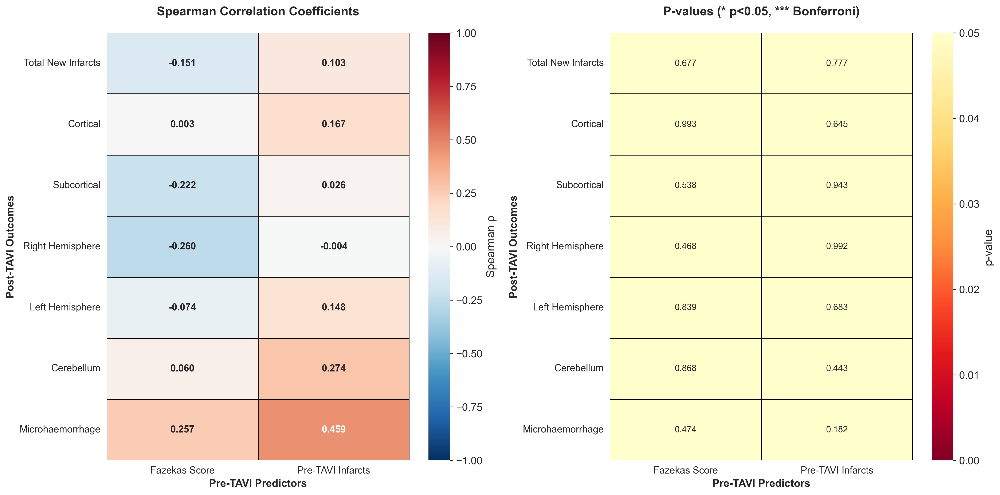

Combined heatmap saved to: /Users/valar/Documents/Projects/MRI-TAVI-Cytokines/results/Clinical_Correlations/Correlation_Combined_Heatmap.png



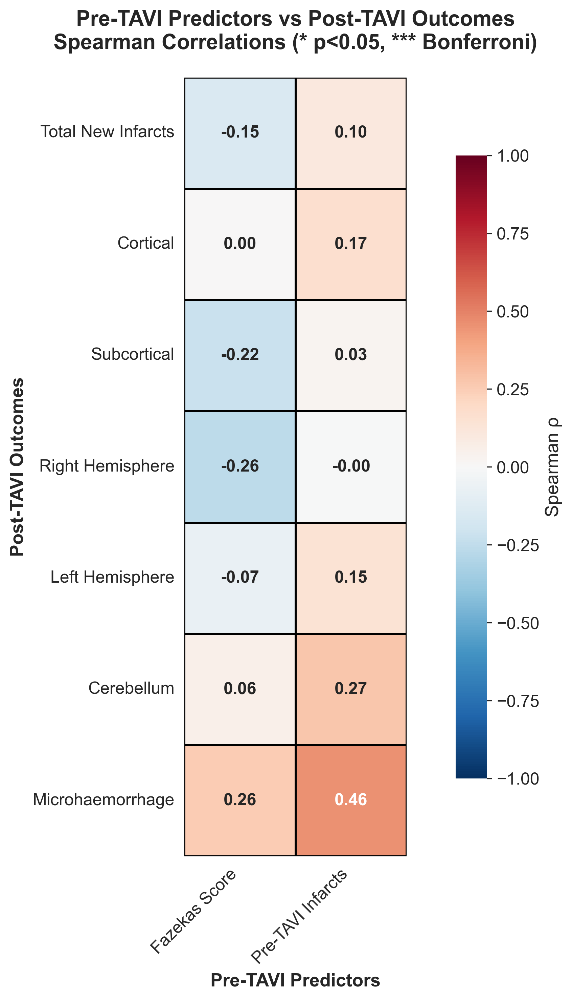

SUMMARY OF SIGNIFICANT CORRELATIONS

Bonferroni-corrected (α=0.0036):
  No significant correlations after Bonferroni correction

Raw significance (α=0.05):
  No significant correlations at α=0.05

FILES SAVED
Location: /Users/valar/Documents/Projects/MRI-TAVI-Cytokines/results/Clinical_Correlations/

Files created:
  - Formatted_Correlation_Table.csv
  - Detailed_Correlation_Results.csv
  - Correlation_Heatmaps.png (side-by-side: rho and p-values)
  - Correlation_Combined_Heatmap.png (single heatmap with significance)


In [24]:
import pandas as pd
import numpy as np
from scipy.stats import spearmanr
import matplotlib.pyplot as plt
import seaborn as sns

# Create correlation analysis folder
correlation_path = f"{results_path}/Clinical_Correlations"
os.makedirs(correlation_path, exist_ok=True)
print(f"Created/verified folder: {correlation_path}\n")

# Define predictor variables (PRE)
predictors = {
    'Fazekas Score': mri_df['PRE_SVD Fazekas Score (1,2,3)'],
    'Pre-TAVI Infarcts': mri_df['PRE_Infarcts - Total Number']
}

# Define outcome variables (POST) - with shorter names for display
outcomes = {
    'Total New Infarcts': mri_df['POST_Number of new acute infarcts'],
    'Cortical': mri_df['POST_New supratentorial infarcts - cortical (number)'],
    'Subcortical': mri_df['POST_New supratentorial infarcts - subcortical (number)'],
    'Right Hemisphere': mri_df['POST_New infarcts - Right cerebral hemisphere (number)'],
    'Left Hemisphere': mri_df['POST_New infarcts - Left cerebral hemisphere (number)'],
    'Cerebellum': mri_df['POST_New Infarcts - Cerebellum (number)'],
    'Microhaemorrhage': mri_df['POST_New microhaemorrhage (number)']
}

# Calculate total number of tests for Bonferroni correction
n_tests = len(predictors) * len(outcomes)
bonf_alpha = 0.05 / n_tests

print("="*80)
print("SPEARMAN CORRELATION ANALYSIS")
print("="*80)
print(f"Total number of tests: {n_tests}")
print(f"Bonferroni-corrected alpha: {bonf_alpha:.4f}")
print("="*80 + "\n")

# Create matrices for rho values and p-values
rho_matrix = np.zeros((len(outcomes), len(predictors)))
p_matrix = np.zeros((len(outcomes), len(predictors)))

# Calculate correlations
for i, (out_name, out_values) in enumerate(outcomes.items()):
    for j, (pred_name, pred_values) in enumerate(predictors.items()):
        rho, p_value = spearmanr(pred_values, out_values)
        rho_matrix[i, j] = rho
        p_matrix[i, j] = p_value

# Create DataFrames
rho_df = pd.DataFrame(rho_matrix, 
                      index=list(outcomes.keys()), 
                      columns=list(predictors.keys()))
p_df = pd.DataFrame(p_matrix, 
                    index=list(outcomes.keys()), 
                    columns=list(predictors.keys()))

# ============================================================================
# CREATE FORMATTED TABLE
# ============================================================================
formatted_table = []
for outcome in outcomes.keys():
    row = {'Post-TAVI Outcome': outcome}
    for predictor in predictors.keys():
        rho = rho_df.loc[outcome, predictor]
        p = p_df.loc[outcome, predictor]
        
        # Add significance markers
        if p < bonf_alpha:
            sig = '***'  # Bonferroni significant
        elif p < 0.05:
            sig = '*'    # Raw significant
        else:
            sig = ''
        
        # Format: rho (p-value) sig
        row[predictor] = f"{rho:.3f} (p={p:.3f}){sig}"
    
    formatted_table.append(row)

formatted_df = pd.DataFrame(formatted_table)

print("="*80)
print("CORRELATION TABLE")
print("* = p<0.05 (raw), *** = Bonferroni-corrected")
print("="*80)
print(formatted_df.to_string(index=False))
print("\n")

# Save formatted table
formatted_df.to_csv(f'{correlation_path}/Formatted_Correlation_Table.csv', index=False)

# ============================================================================
# CREATE DETAILED RESULTS TABLE
# ============================================================================
detailed_results = []
for outcome in outcomes.keys():
    for predictor in predictors.keys():
        rho = rho_df.loc[outcome, predictor]
        p = p_df.loc[outcome, predictor]
        
        detailed_results.append({
            'Pre-TAVI Predictor': predictor,
            'Post-TAVI Outcome': outcome,
            'Spearman ρ': f"{rho:.3f}",
            'p-value': f"{p:.4f}",
            'Sig (α=0.05)': '✓' if p < 0.05 else '',
            'Sig (Bonferroni)': '✓' if p < bonf_alpha else ''
        })

detailed_df = pd.DataFrame(detailed_results)
detailed_df = detailed_df.sort_values('p-value')

print("="*80)
print("DETAILED RESULTS (sorted by p-value)")
print("="*80)
print(detailed_df.to_string(index=False))
print("\n")

# Save detailed table
detailed_df.to_csv(f'{correlation_path}/Detailed_Correlation_Results.csv', index=False)

# ============================================================================
# CREATE HEATMAP
# ============================================================================
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# Heatmap 1: Correlation coefficients
sns.heatmap(rho_df, annot=True, fmt='.3f', cmap='RdBu_r', center=0, 
            vmin=-1, vmax=1, cbar_kws={'label': 'Spearman ρ'},
            linewidths=0.5, linecolor='black', ax=ax1,
            annot_kws={'fontsize': 11, 'fontweight': 'bold'})
ax1.set_title('Spearman Correlation Coefficients', fontweight='bold', pad=20, fontsize=14)
ax1.set_xlabel('Pre-TAVI Predictors', fontweight='bold', fontsize=12)
ax1.set_ylabel('Post-TAVI Outcomes', fontweight='bold', fontsize=12)
ax1.tick_params(axis='both', labelsize=11)

# Heatmap 2: P-values with significance marking
# Create annotations with significance markers
annot_array = np.empty_like(p_matrix, dtype=object)
for i in range(p_matrix.shape[0]):
    for j in range(p_matrix.shape[1]):
        p_val = p_matrix[i, j]
        if p_val < bonf_alpha:
            annot_array[i, j] = f'{p_val:.3f}***'
        elif p_val < 0.05:
            annot_array[i, j] = f'{p_val:.3f}*'
        else:
            annot_array[i, j] = f'{p_val:.3f}'

# Use reversed colormap (white = low p-value = significant)
sns.heatmap(p_df, annot=annot_array, fmt='', cmap='YlOrRd_r', 
            vmin=0, vmax=0.05, cbar_kws={'label': 'p-value'},
            linewidths=0.5, linecolor='black', ax=ax2,
            annot_kws={'fontsize': 10})
ax2.set_title('P-values (* p<0.05, *** Bonferroni)', fontweight='bold', pad=20, fontsize=14)
ax2.set_xlabel('Pre-TAVI Predictors', fontweight='bold', fontsize=12)
ax2.set_ylabel('Post-TAVI Outcomes', fontweight='bold', fontsize=12)
ax2.tick_params(axis='both', labelsize=11)

plt.tight_layout()
plt.savefig(f'{correlation_path}/Correlation_Heatmaps.png', dpi=300, bbox_inches='tight')
print("="*80)
print("HEATMAP SAVED")
print("="*80)
plt.show()

# ============================================================================
# CREATE SINGLE COMBINED HEATMAP (ALTERNATIVE)
# ============================================================================
fig, ax = plt.subplots(figsize=(10, 10))

# Create custom annotations: rho value + significance stars
annot_combined = np.empty_like(rho_matrix, dtype=object)
for i in range(rho_matrix.shape[0]):
    for j in range(rho_matrix.shape[1]):
        rho = rho_matrix[i, j]
        p = p_matrix[i, j]
        
        if p < bonf_alpha:
            sig = '***'
        elif p < 0.05:
            sig = '*'
        else:
            sig = ''
        
        annot_combined[i, j] = f'{rho:.2f}{sig}'

sns.heatmap(rho_df, annot=annot_combined, fmt='', cmap='RdBu_r', center=0, 
            vmin=-1, vmax=1, cbar_kws={'label': 'Spearman ρ', 'shrink': 0.8},
            linewidths=1, linecolor='black', ax=ax,
            annot_kws={'fontsize': 12, 'fontweight': 'bold'},
            square=True)

ax.set_title('Pre-TAVI Predictors vs Post-TAVI Outcomes\nSpearman Correlations (* p<0.05, *** Bonferroni)', 
            fontweight='bold', pad=20, fontsize=15)
ax.set_xlabel('Pre-TAVI Predictors', fontweight='bold', fontsize=13)
ax.set_ylabel('Post-TAVI Outcomes', fontweight='bold', fontsize=13)
ax.tick_params(axis='both', labelsize=12)

# Rotate x-axis labels for better readability
plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.savefig(f'{correlation_path}/Correlation_Combined_Heatmap.png', dpi=300, bbox_inches='tight')
print(f"Combined heatmap saved to: {correlation_path}/Correlation_Combined_Heatmap.png\n")
plt.show()

# ============================================================================
# SUMMARY
# ============================================================================
print("="*80)
print("SUMMARY OF SIGNIFICANT CORRELATIONS")
print("="*80)

sig_bonf = detailed_df[detailed_df['Sig (Bonferroni)'] == '✓']
sig_raw = detailed_df[detailed_df['Sig (α=0.05)'] == '✓']

print(f"\nBonferroni-corrected (α={bonf_alpha:.4f}):")
if len(sig_bonf) > 0:
    print(sig_bonf[['Pre-TAVI Predictor', 'Post-TAVI Outcome', 'Spearman ρ', 'p-value']].to_string(index=False))
else:
    print("  No significant correlations after Bonferroni correction")

print(f"\nRaw significance (α=0.05):")
if len(sig_raw) > 0:
    print(sig_raw[['Pre-TAVI Predictor', 'Post-TAVI Outcome', 'Spearman ρ', 'p-value']].to_string(index=False))
else:
    print("  No significant correlations at α=0.05")

print("\n" + "="*80)
print("FILES SAVED")
print("="*80)
print(f"Location: {correlation_path}/")
print("\nFiles created:")
print("  - Formatted_Correlation_Table.csv")
print("  - Detailed_Correlation_Results.csv")
print("  - Correlation_Heatmaps.png (side-by-side: rho and p-values)")
print("  - Correlation_Combined_Heatmap.png (single heatmap with significance)")

# Step 5: Spearman Correlation - Cytokines

Created/verified folder: /Users/valar/Documents/Projects/MRI-TAVI-Cytokines/results/Cytokine_Correlations

DATA PREPARATION COMPLETE
Number of subjects: 10
Number of cytokine variables: 140

CYTOKINE-MRI CORRELATION ANALYSIS
Using STRATIFIED Bonferroni correction:
  - Each comparison group (T1, T2, T3, T4, changes) corrected separately
  - Tests per group: 14 cytokines × 9 MRI outcomes = 126 tests
  - Bonferroni alpha per group: 0.05/126 = 0.000397

Processing T1: 14 cytokines × 9 outcomes = 126 tests, α=0.000397
Processing T2: 14 cytokines × 9 outcomes = 126 tests, α=0.000397
Processing T3: 14 cytokines × 9 outcomes = 126 tests, α=0.000397
Processing T4: 14 cytokines × 9 outcomes = 126 tests, α=0.000397
Processing T1-T2: 14 cytokines × 9 outcomes = 126 tests, α=0.000397
Processing T1-T3: 14 cytokines × 9 outcomes = 126 tests, α=0.000397
Processing T1-T4: 14 cytokines × 9 outcomes = 126 tests, α=0.000397
Processing T2-T3: 14 cytokines × 9 outcomes = 126 tests, α=0.000397
Processing T2-

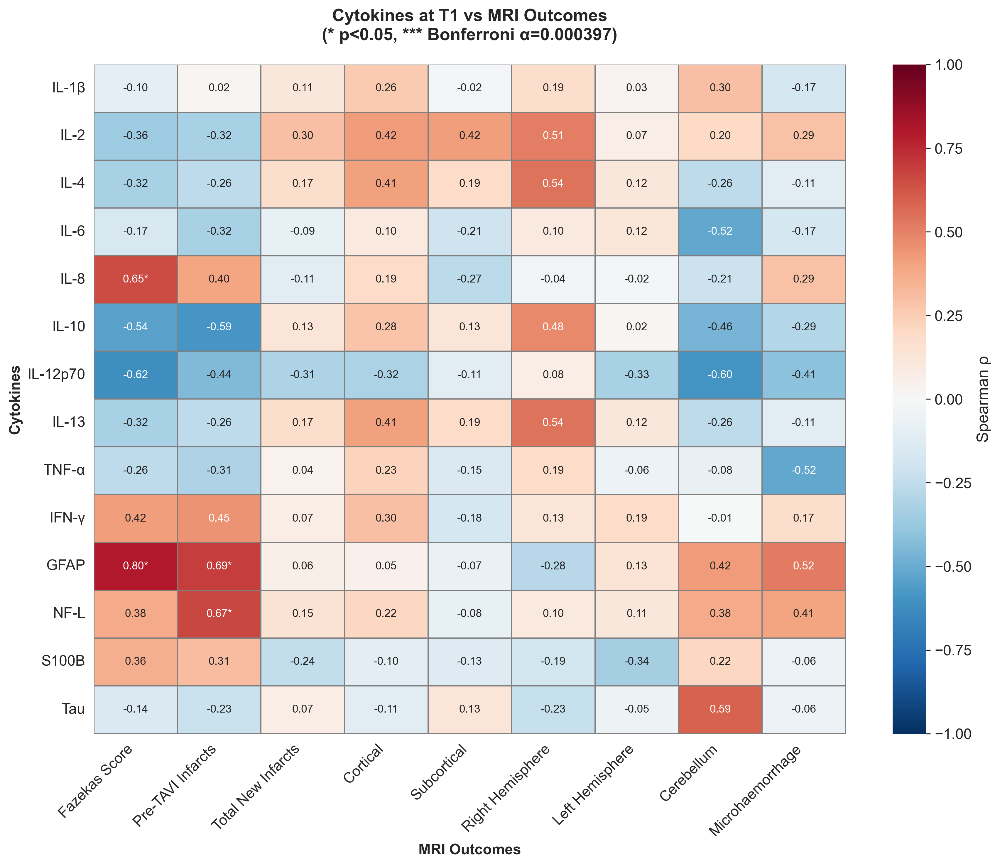

Saved heatmap: T2


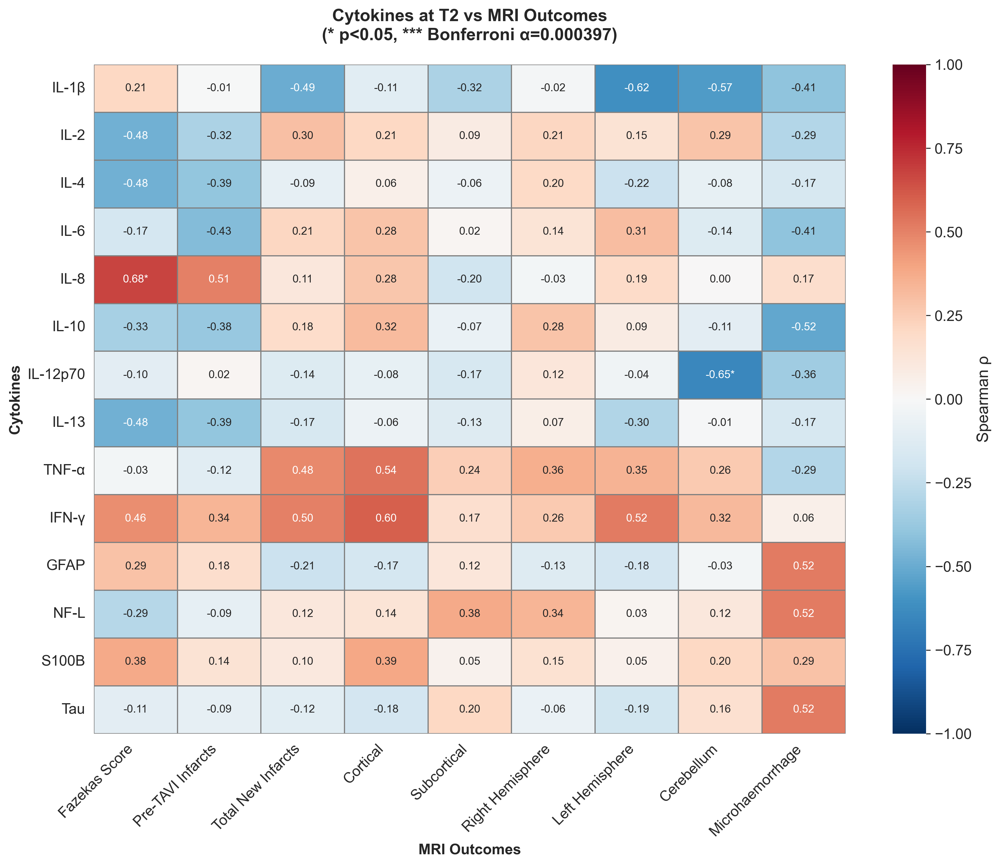

Saved heatmap: T3


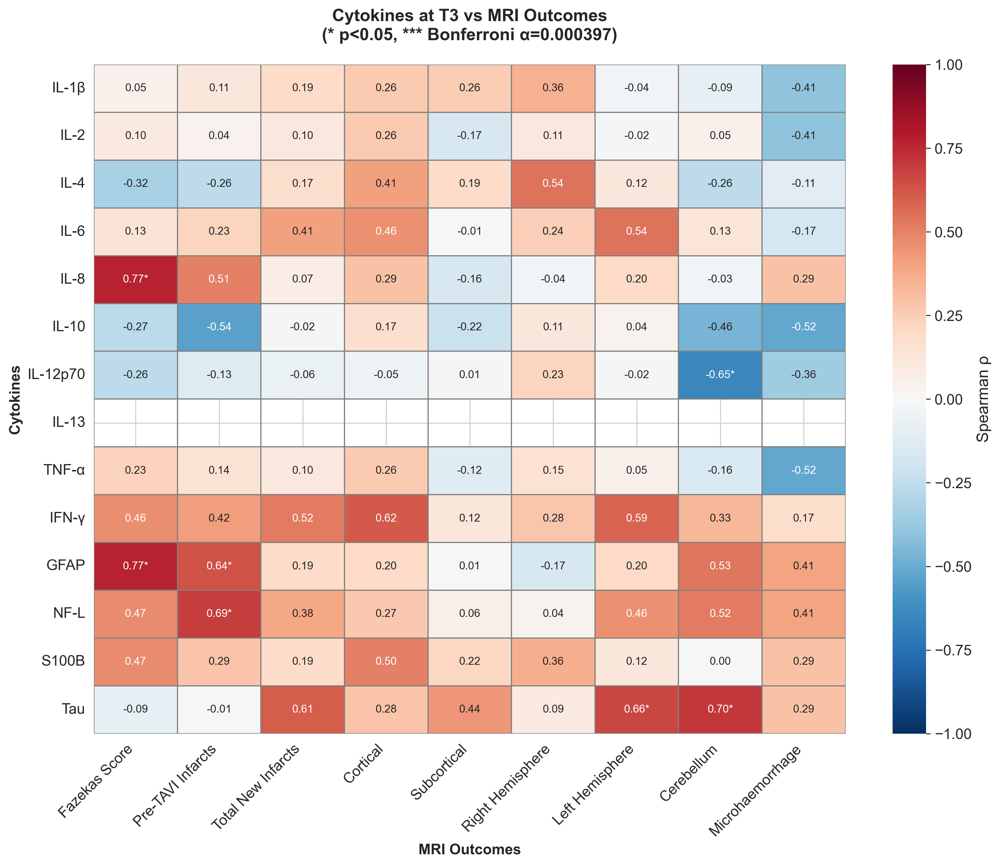

Saved heatmap: T4


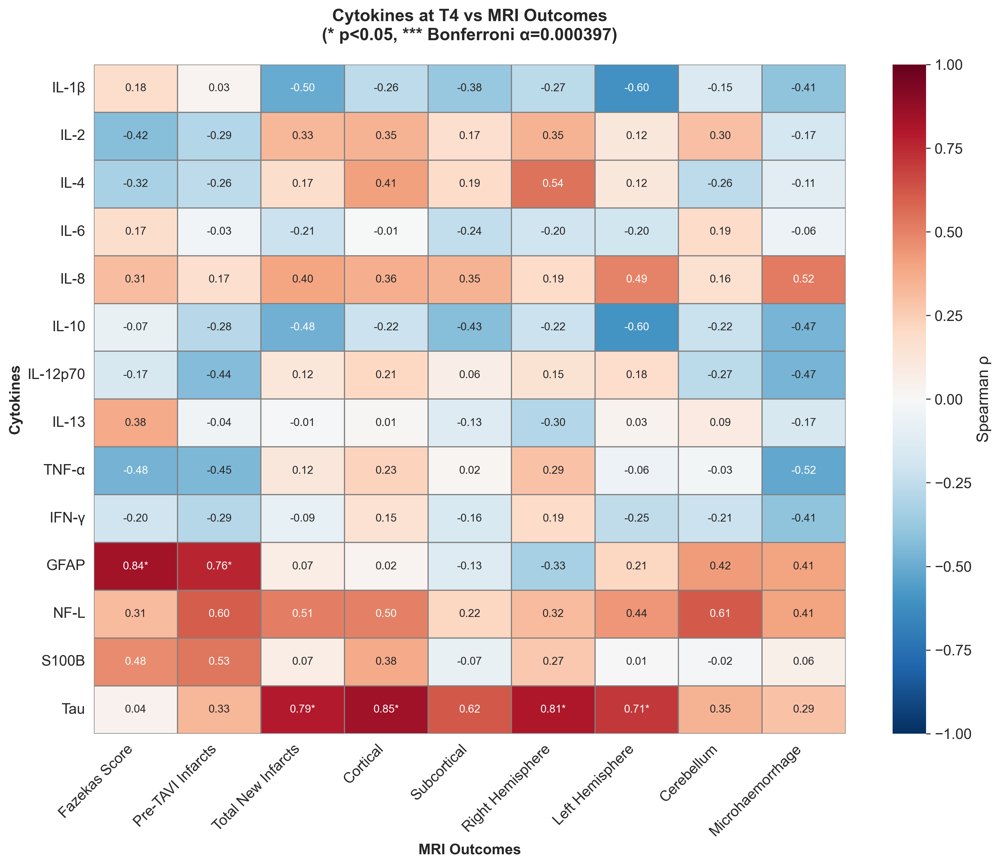

Saved heatmap: T1-T2


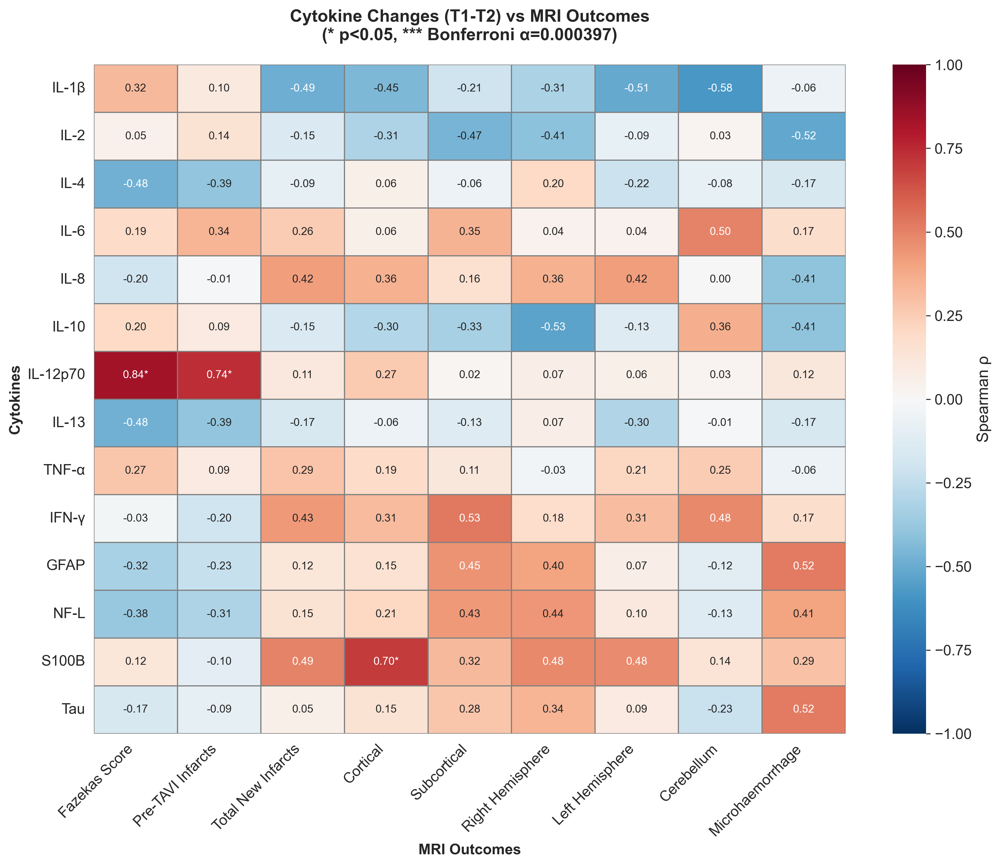

Saved heatmap: T1-T3


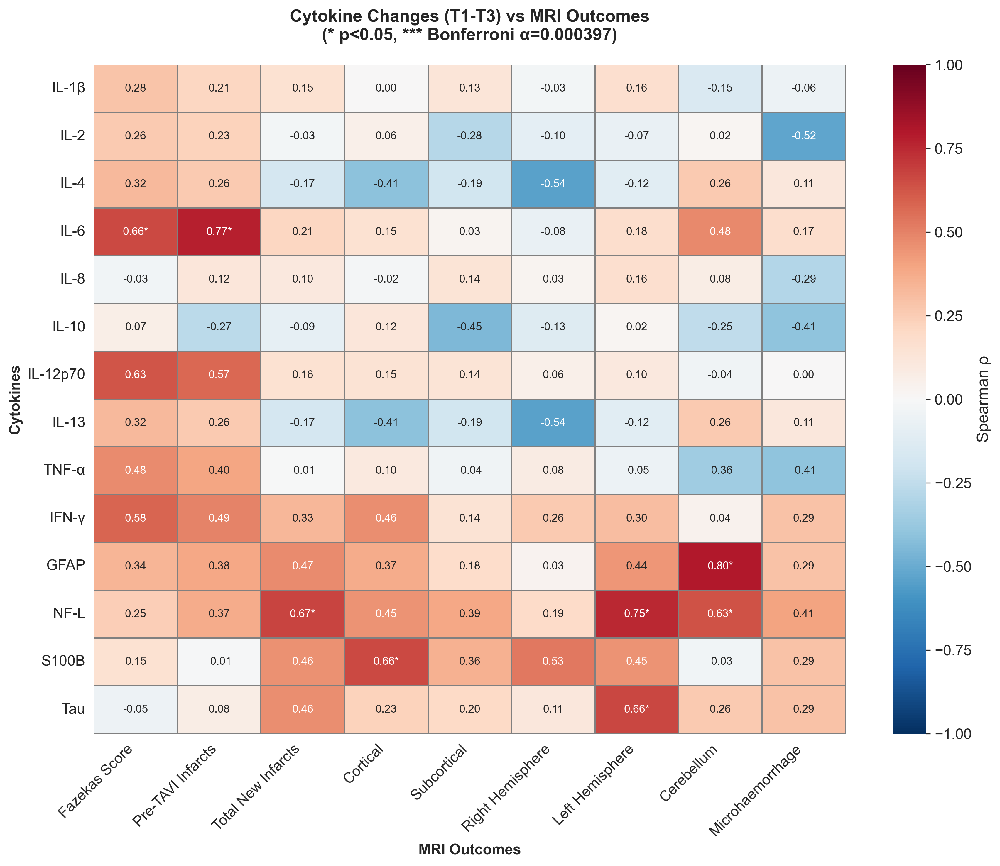

Saved heatmap: T1-T4


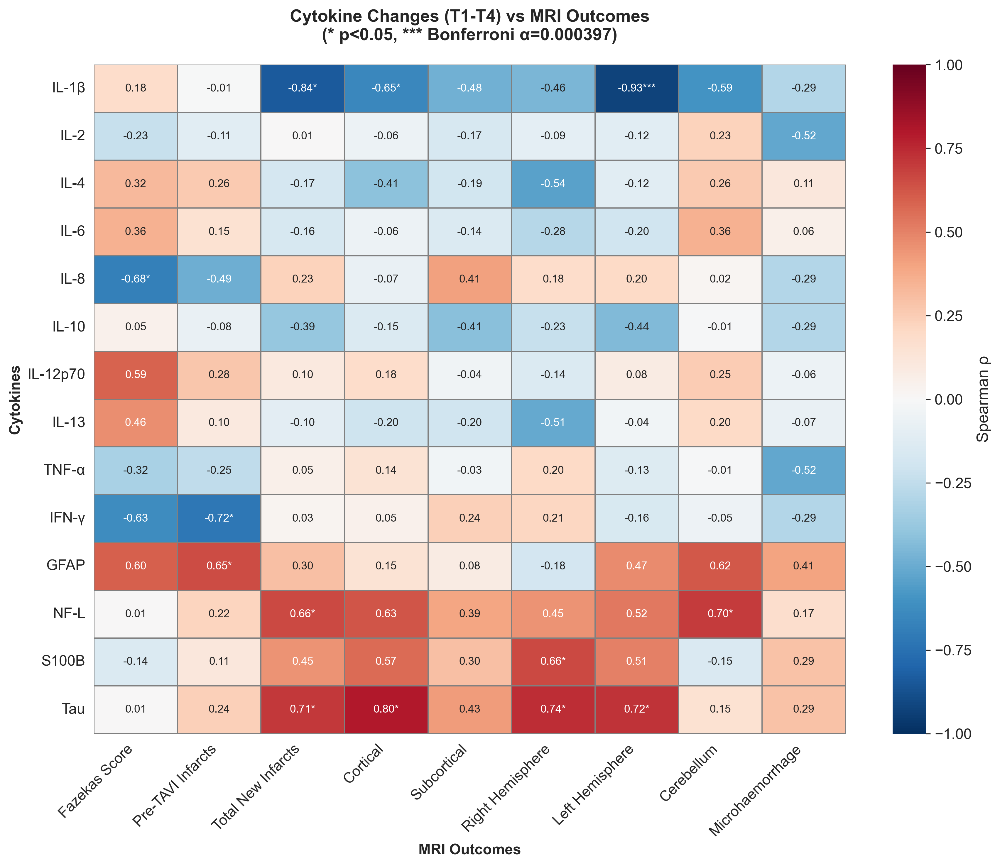

Saved heatmap: T2-T3


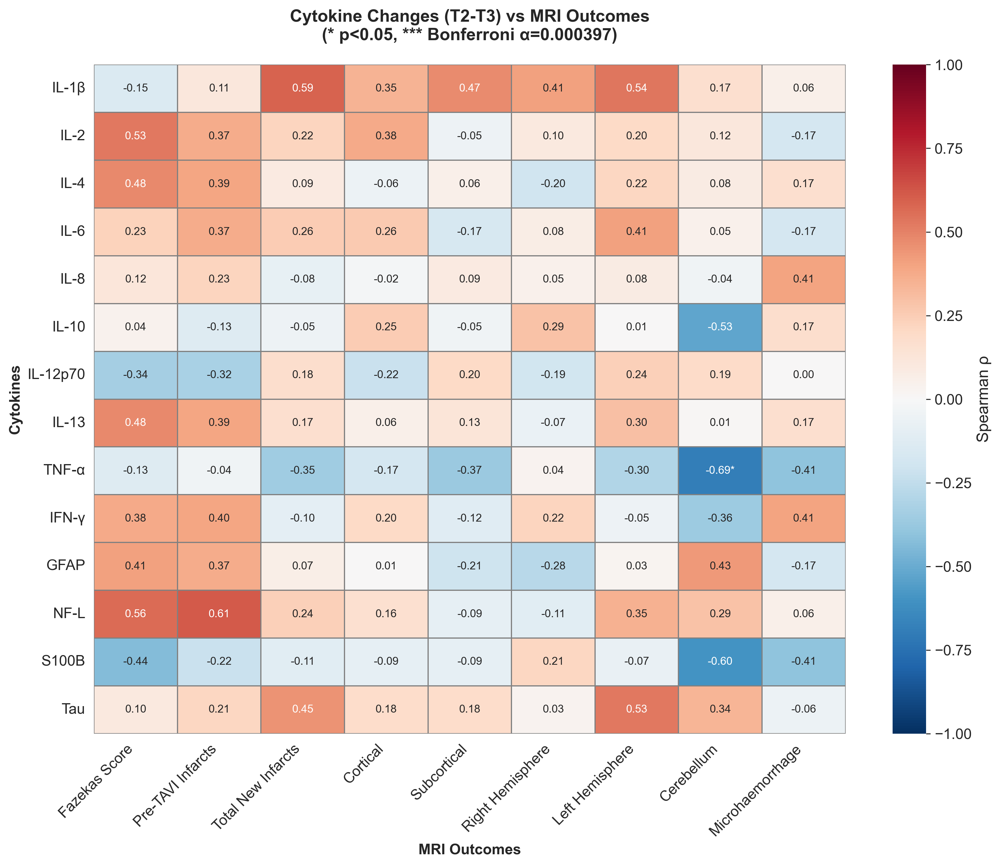

Saved heatmap: T2-T4


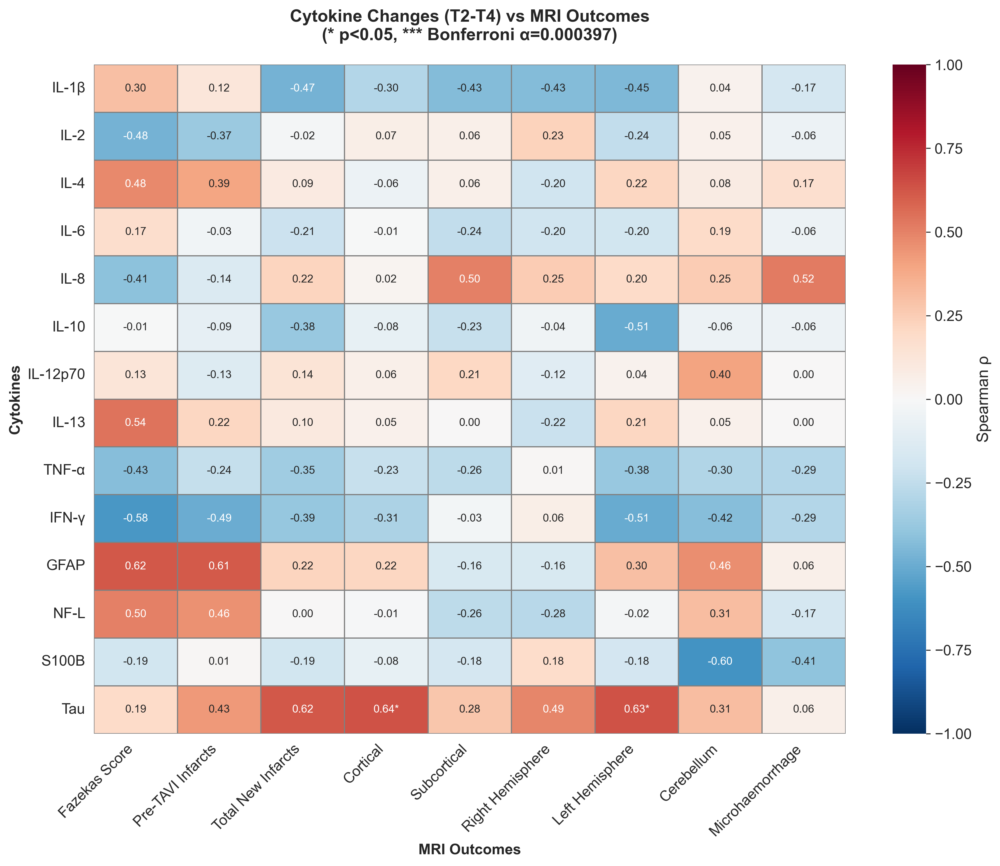

Saved heatmap: T3-T4


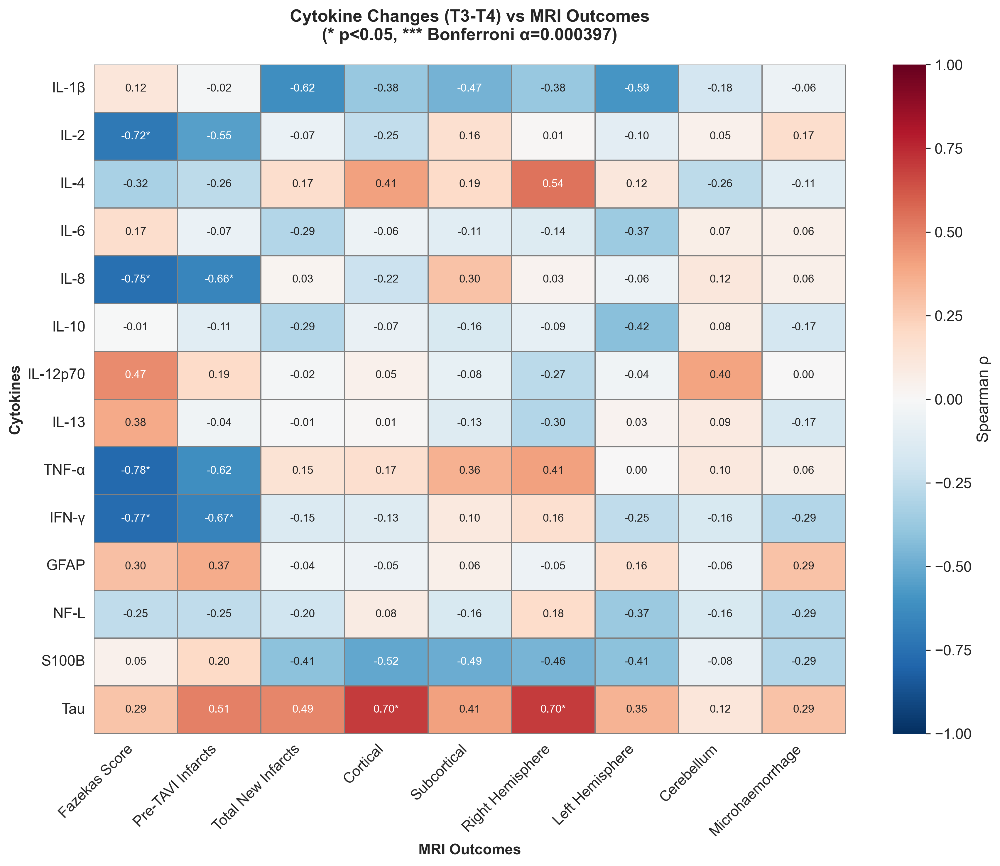


ALL FILES SAVED
Location: /Users/valar/Documents/Projects/MRI-TAVI-Cytokines/results/Cytokine_Correlations/

Files created:
  - Comprehensive_Correlations.tsv (main file for exploration)
  - All_Cytokine_MRI_Correlations.csv (complete results)
  - Significant_Bonferroni_Correlations.csv (if any)
  - Significant_Raw_Correlations.csv (if any)
  - Heatmap_T1.png through Heatmap_T3-T4.png (10 heatmaps)


In [23]:
import pandas as pd
import numpy as np
from scipy.stats import spearmanr
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy.stats import ConstantInputWarning
import os

# Suppress the constant input warning
warnings.filterwarnings('ignore', category=ConstantInputWarning)

# Create correlation analysis folder
cytokine_correlation_path = f"{results_path}/Cytokine_Correlations"
os.makedirs(cytokine_correlation_path, exist_ok=True)
print(f"Created/verified folder: {cytokine_correlation_path}\n")

# ============================================================================
# PREPARE CYTOKINE DATA
# ============================================================================

# List of cytokines to analyze
cytokines = ['IL-1β', 'IL-2', 'IL-4', 'IL-6', 'IL-8', 'IL-10', 'IL-12p70', 
             'IL-13', 'TNF-α', 'IFN-γ', 'GFAP', 'NF-L', 'S100B', 'Tau']

# Reshape cytokine data to wide format (one row per patient)
cytokine_wide = {}
for subject in cytokines_df['Subject'].unique():
    subject_data = cytokines_df[cytokines_df['Subject'] == subject].sort_values('Time point')
    cytokine_wide[subject] = {}
    
    for cytokine in cytokines:
        values = subject_data[cytokine].values
        # Individual timepoints
        cytokine_wide[subject][f'{cytokine}_T1'] = values[0] if len(values) >= 1 else np.nan
        cytokine_wide[subject][f'{cytokine}_T2'] = values[1] if len(values) >= 2 else np.nan
        cytokine_wide[subject][f'{cytokine}_T3'] = values[2] if len(values) >= 3 else np.nan
        cytokine_wide[subject][f'{cytokine}_T4'] = values[3] if len(values) >= 4 else np.nan
        
        # Calculate changes (delta values)
        if len(values) >= 2:
            cytokine_wide[subject][f'{cytokine}_T1-T2'] = values[1] - values[0]
        if len(values) >= 3:
            cytokine_wide[subject][f'{cytokine}_T1-T3'] = values[2] - values[0]
            cytokine_wide[subject][f'{cytokine}_T2-T3'] = values[2] - values[1]
        if len(values) >= 4:
            cytokine_wide[subject][f'{cytokine}_T1-T4'] = values[3] - values[0]
            cytokine_wide[subject][f'{cytokine}_T2-T4'] = values[3] - values[1]
            cytokine_wide[subject][f'{cytokine}_T3-T4'] = values[3] - values[2]

# Convert to DataFrame
cytokine_wide_df = pd.DataFrame(cytokine_wide).T
cytokine_wide_df.index.name = 'Subject'
cytokine_wide_df = cytokine_wide_df.reset_index()

# Merge with MRI data
merged_df = mri_df.merge(cytokine_wide_df, on='Subject')

print("="*80)
print("DATA PREPARATION COMPLETE")
print("="*80)
print(f"Number of subjects: {len(merged_df)}")
print(f"Number of cytokine variables: {len([c for c in merged_df.columns if any(cyt in c for cyt in cytokines)])}")
print("="*80 + "\n")

# ============================================================================
# DEFINE PREDICTORS AND OUTCOMES
# ============================================================================

# Cytokine predictors (all timepoints and changes)
cytokine_predictors = {}
for col in merged_df.columns:
    if any(cyt in col for cyt in cytokines) and (col.endswith(('_T1', '_T2', '_T3', '_T4')) or 
                                                   'T1-T2' in col or 'T1-T3' in col or 'T1-T4' in col or 
                                                   'T2-T3' in col or 'T2-T4' in col or 'T3-T4' in col):
        cytokine_predictors[col] = merged_df[col]

# MRI outcomes
mri_outcomes = {
    'Fazekas Score': merged_df['PRE_SVD Fazekas Score (1,2,3)'],
    'Pre-TAVI Infarcts': merged_df['PRE_Infarcts - Total Number'],
    'Total New Infarcts': merged_df['POST_Number of new acute infarcts'],
    'Cortical': merged_df['POST_New supratentorial infarcts - cortical (number)'],
    'Subcortical': merged_df['POST_New supratentorial infarcts - subcortical (number)'],
    'Right Hemisphere': merged_df['POST_New infarcts - Right cerebral hemisphere (number)'],
    'Left Hemisphere': merged_df['POST_New infarcts - Left cerebral hemisphere (number)'],
    'Cerebellum': merged_df['POST_New Infarcts - Cerebellum (number)'],
    'Microhaemorrhage': merged_df['POST_New microhaemorrhage (number)']
}

print("="*80)
print("CYTOKINE-MRI CORRELATION ANALYSIS")
print("="*80)
print("Using STRATIFIED Bonferroni correction:")
print("  - Each comparison group (T1, T2, T3, T4, changes) corrected separately")
print("  - Tests per group: 14 cytokines × 9 MRI outcomes = 126 tests")
print("  - Bonferroni alpha per group: 0.05/126 = 0.000397")
print("="*80 + "\n")

# ============================================================================
# CALCULATE CORRELATIONS WITH STRATIFIED BONFERRONI
# ============================================================================

results_list = []

# Loop through each comparison group separately
for group_name in ['T1', 'T2', 'T3', 'T4', 'T1-T2', 'T1-T3', 'T1-T4', 'T2-T3', 'T2-T4', 'T3-T4']:
    # Get cytokines for this group
    if group_name in ['T1', 'T2', 'T3', 'T4']:
        group_cytokines = {k: v for k, v in cytokine_predictors.items() if k.endswith(f'_{group_name}')}
    else:
        group_cytokines = {k: v for k, v in cytokine_predictors.items() if group_name in k}
    
    # Calculate Bonferroni for this group only
    n_tests_group = len(group_cytokines) * len(mri_outcomes)
    bonf_alpha_group = 0.05 / n_tests_group if n_tests_group > 0 else 0.05
    
    print(f"Processing {group_name}: {len(group_cytokines)} cytokines × {len(mri_outcomes)} outcomes = {n_tests_group} tests, α={bonf_alpha_group:.6f}")
    
    # Calculate correlations for this group
    for pred_name, pred_values in group_cytokines.items():
        for out_name, out_values in mri_outcomes.items():
            # Check for NaN values
            valid_mask = ~(pred_values.isna() | out_values.isna())
            
            if valid_mask.sum() >= 3:  # Need at least 3 valid pairs
                # Check for constant variables to avoid warnings
                if pred_values[valid_mask].std() == 0 or out_values[valid_mask].std() == 0:
                    results_list.append({
                        'Cytokine Predictor': pred_name,
                        'MRI Outcome': out_name,
                        'Spearman ρ': np.nan,
                        'p-value': np.nan,
                        'n': valid_mask.sum(),
                        'n_tests_in_group': n_tests_group,
                        'Bonferroni_alpha_group': bonf_alpha_group,
                        'Sig (α=0.05)': '',
                        'Sig (Bonferroni)': ''
                    })
                else:
                    rho, p_value = spearmanr(pred_values[valid_mask], out_values[valid_mask])
                    
                    results_list.append({
                        'Cytokine Predictor': pred_name,
                        'MRI Outcome': out_name,
                        'Spearman ρ': rho,
                        'p-value': p_value,
                        'n': valid_mask.sum(),
                        'n_tests_in_group': n_tests_group,
                        'Bonferroni_alpha_group': bonf_alpha_group,
                        'Sig (α=0.05)': '✓' if p_value < 0.05 else '',
                        'Sig (Bonferroni)': '✓' if p_value < bonf_alpha_group else ''
                    })

# Create results DataFrame
results_df = pd.DataFrame(results_list)
results_df = results_df.sort_values('p-value')

# ============================================================================
# CREATE ENHANCED SUMMARY TABLE WITH SIGNIFICANCE MARKERS
# ============================================================================

print("\n" + "="*80)
print("ENHANCED SUMMARY TABLE - TOP 50 CORRELATIONS")
print("="*80)

# Create enhanced display with significance markers
enhanced_results = results_df.copy()

# Add significance marker column
def get_sig_marker(row):
    if pd.isna(row['p-value']):
        return 'N/A'
    elif row['Sig (Bonferroni)'] == '✓':
        return '***'
    elif row['Sig (α=0.05)'] == '✓':
        return '*'
    else:
        return 'ns'

enhanced_results['Significance'] = enhanced_results.apply(get_sig_marker, axis=1)

# Create formatted display version
display_results = enhanced_results.copy()
display_results['Spearman ρ'] = display_results['Spearman ρ'].apply(
    lambda x: f"{x:.3f}" if not pd.isna(x) else "N/A")
display_results['p-value'] = display_results['p-value'].apply(
    lambda x: f"{x:.4f}" if not pd.isna(x) else "N/A")

# Show top 50
print(display_results[['Cytokine Predictor', 'MRI Outcome', 'Spearman ρ', 
                       'p-value', 'Significance', 'n']].head(50).to_string(index=False))

# ============================================================================
# CREATE COMPREHENSIVE TSV FILE FOR EASY EXPLORATION
# ============================================================================

# Add a "Comparison" column that matches heatmap titles
def get_comparison_group(cytokine_name):
    """Extract the timepoint/change group from cytokine name"""
    if cytokine_name.endswith('_T1'):
        return 'T1'
    elif cytokine_name.endswith('_T2'):
        return 'T2'
    elif cytokine_name.endswith('_T3'):
        return 'T3'
    elif cytokine_name.endswith('_T4'):
        return 'T4'
    elif 'T1-T2' in cytokine_name:
        return 'T1-T2 (Change)'
    elif 'T1-T3' in cytokine_name:
        return 'T1-T3 (Change)'
    elif 'T1-T4' in cytokine_name:
        return 'T1-T4 (Change)'
    elif 'T2-T3' in cytokine_name:
        return 'T2-T3 (Change)'
    elif 'T2-T4' in cytokine_name:
        return 'T2-T4 (Change)'
    elif 'T3-T4' in cytokine_name:
        return 'T3-T4 (Change)'
    else:
        return 'Unknown'

# Extract just the cytokine name (without timepoint suffix)
def get_cytokine_name_only(full_name):
    """Extract cytokine name without timepoint"""
    for suffix in ['_T1', '_T2', '_T3', '_T4', '_T1-T2', '_T1-T3', '_T1-T4', 
                   '_T2-T3', '_T2-T4', '_T3-T4']:
        if full_name.endswith(suffix):
            return full_name.replace(suffix, '')
    return full_name

# Create comprehensive table
comprehensive_table = enhanced_results.copy()
comprehensive_table['Comparison_Group'] = comprehensive_table['Cytokine Predictor'].apply(get_comparison_group)
comprehensive_table['Cytokine'] = comprehensive_table['Cytokine Predictor'].apply(get_cytokine_name_only)

# Calculate Bonferroni-corrected p-value (adjusted within group)
comprehensive_table['p-value (Bonferroni)'] = comprehensive_table.apply(
    lambda row: row['p-value'] * row['n_tests_in_group'] if not pd.isna(row['p-value']) else np.nan,
    axis=1
)

# Reorder columns for easier exploration
comprehensive_table = comprehensive_table[[
    'Comparison_Group',
    'Cytokine',
    'Cytokine Predictor',
    'MRI Outcome',
    'Spearman ρ',
    'p-value',
    'p-value (Bonferroni)',
    'n_tests_in_group',
    'Bonferroni_alpha_group',
    'Significance',
    'Sig (α=0.05)',
    'Sig (Bonferroni)',
    'n'
]]

# Sort by Comparison Group, then by p-value
comprehensive_table = comprehensive_table.sort_values(['Comparison_Group', 'p-value'])

# Save as TSV
comprehensive_table.to_csv(f'{cytokine_correlation_path}/Comprehensive_Correlations.tsv', 
                          sep='\t', index=False)

print("\n" + "="*80)
print("COMPREHENSIVE TSV FILE CREATED")
print("="*80)
print(f"File: {cytokine_correlation_path}/Comprehensive_Correlations.tsv")
print("\nThis file contains:")
print("  - Comparison_Group: Matches heatmap titles (T1, T2, T3, T4, or Change periods)")
print("  - Cytokine: Just the cytokine name")
print("  - Cytokine Predictor: Full variable name with timepoint")
print("  - MRI Outcome: The outcome being correlated")
print("  - Spearman ρ: Correlation coefficient")
print("  - p-value: Raw p-value")
print("  - p-value (Bonferroni): Bonferroni-corrected p-value (within group)")
print("  - n_tests_in_group: Number of tests in this comparison group")
print("  - Bonferroni_alpha_group: Significance threshold for this group")
print("  - Significance: *** (Bonferroni), * (p<0.05), ns (not significant), or N/A (constant)")
print("  - Sig (α=0.05): ✓ or empty")
print("  - Sig (Bonferroni): ✓ or empty")
print("  - n: Sample size for that correlation")
print("\nYou can easily filter by Comparison_Group to see all correlations for each heatmap!")

# Save full results
display_results.to_csv(f'{cytokine_correlation_path}/All_Cytokine_MRI_Correlations.csv', index=False)

# ============================================================================
# SIGNIFICANT CORRELATIONS SUMMARY
# ============================================================================

sig_bonf = results_df[results_df['Sig (Bonferroni)'] == '✓']
sig_raw = results_df[results_df['Sig (α=0.05)'] == '✓']

print("\n" + "="*80)
print(f"BONFERRONI-CORRECTED SIGNIFICANT CORRELATIONS (stratified by group)")
print("="*80)
if len(sig_bonf) > 0:
    print(f"Found {len(sig_bonf)} significant correlations after Bonferroni correction")
    sig_bonf_display = sig_bonf.copy()
    sig_bonf_display['Spearman ρ'] = sig_bonf_display['Spearman ρ'].apply(lambda x: f"{x:.3f}")
    sig_bonf_display['p-value'] = sig_bonf_display['p-value'].apply(lambda x: f"{x:.6f}")
    print(sig_bonf_display[['Cytokine Predictor', 'MRI Outcome', 'Spearman ρ', 
                             'p-value', 'Bonferroni_alpha_group']].to_string(index=False))
    sig_bonf_display.to_csv(f'{cytokine_correlation_path}/Significant_Bonferroni_Correlations.csv', index=False)
else:
    print(f"No significant correlations after stratified Bonferroni correction")

print("\n" + "="*80)
print(f"RAW SIGNIFICANT CORRELATIONS (α=0.05)")
print("="*80)
if len(sig_raw) > 0:
    print(f"Found {len(sig_raw)} significant correlations at α=0.05")
    sig_raw_display = sig_raw.copy()
    sig_raw_display['Spearman ρ'] = sig_raw_display['Spearman ρ'].apply(lambda x: f"{x:.3f}")
    sig_raw_display['p-value'] = sig_raw_display['p-value'].apply(lambda x: f"{x:.4f}")
    print(sig_raw_display.head(30)[['Cytokine Predictor', 'MRI Outcome', 'Spearman ρ', 'p-value']].to_string(index=False))
    sig_raw_display.to_csv(f'{cytokine_correlation_path}/Significant_Raw_Correlations.csv', index=False)
else:
    print("No significant correlations at α=0.05")

# ============================================================================
# CREATE SUMMARY BY COMPARISON GROUP
# ============================================================================

print("\n" + "="*80)
print("SUMMARY BY COMPARISON GROUP")
print("="*80)

for group in ['T1', 'T2', 'T3', 'T4', 'T1-T2 (Change)', 'T1-T3 (Change)', 
              'T1-T4 (Change)', 'T2-T3 (Change)', 'T2-T4 (Change)', 'T3-T4 (Change)']:
    group_data = comprehensive_table[comprehensive_table['Comparison_Group'] == group]
    n_total = len(group_data)
    n_sig_bonf = (group_data['Sig (Bonferroni)'] == '✓').sum()
    n_sig_raw = (group_data['Sig (α=0.05)'] == '✓').sum()
    
    if n_total > 0:
        bonf_alpha = group_data['Bonferroni_alpha_group'].iloc[0]
        print(f"\n{group} (Bonferroni α={bonf_alpha:.6f}):")
        print(f"  Total correlations: {n_total}")
        print(f"  Significant (Bonferroni): {n_sig_bonf}")
        print(f"  Significant (α=0.05): {n_sig_raw}")
        print(f"  Non-significant: {n_total - n_sig_raw}")
        
        if n_sig_raw > 0:
            print(f"  Top 3 correlations:")
            top3 = group_data[group_data['Sig (α=0.05)'] == '✓'].head(3)
            for _, row in top3.iterrows():
                rho_val = row['Spearman ρ']
                p_val = row['p-value']
                if not pd.isna(rho_val) and not pd.isna(p_val):
                    print(f"    - {row['Cytokine']} vs {row['MRI Outcome']}: ρ={rho_val:.3f}, p={p_val:.4f} {row['Significance']}")

# ============================================================================
# CREATE HEATMAPS FOR EACH TIMEPOINT/CHANGE
# ============================================================================

print("\n" + "="*80)
print("GENERATING HEATMAPS")
print("="*80)

# Group cytokines by timepoint/change type
timepoint_groups = {
    'T1': [c for c in cytokine_predictors.keys() if c.endswith('_T1')],
    'T2': [c for c in cytokine_predictors.keys() if c.endswith('_T2')],
    'T3': [c for c in cytokine_predictors.keys() if c.endswith('_T3')],
    'T4': [c for c in cytokine_predictors.keys() if c.endswith('_T4')],
    'T1-T2': [c for c in cytokine_predictors.keys() if 'T1-T2' in c],
    'T1-T3': [c for c in cytokine_predictors.keys() if 'T1-T3' in c],
    'T1-T4': [c for c in cytokine_predictors.keys() if 'T1-T4' in c],
    'T2-T3': [c for c in cytokine_predictors.keys() if 'T2-T3' in c],
    'T2-T4': [c for c in cytokine_predictors.keys() if 'T2-T4' in c],
    'T3-T4': [c for c in cytokine_predictors.keys() if 'T3-T4' in c]
}

# Create heatmap for each timepoint group
for group_name, cytokine_cols in timepoint_groups.items():
    if len(cytokine_cols) == 0:
        continue
    
    # Get Bonferroni alpha for this group
    n_tests_group = len(cytokine_cols) * len(mri_outcomes)
    bonf_alpha_group = 0.05 / n_tests_group
    
    # Create matrices
    rho_matrix = np.zeros((len(cytokine_cols), len(mri_outcomes)))
    p_matrix = np.zeros((len(cytokine_cols), len(mri_outcomes)))
    
    for i, cyt_col in enumerate(cytokine_cols):
        for j, (out_name, out_values) in enumerate(mri_outcomes.items()):
            pred_values = cytokine_predictors[cyt_col]
            valid_mask = ~(pred_values.isna() | out_values.isna())
            
            if valid_mask.sum() >= 3:
                # Check for constant variables
                if pred_values[valid_mask].std() == 0 or out_values[valid_mask].std() == 0:
                    rho_matrix[i, j] = np.nan
                    p_matrix[i, j] = np.nan
                else:
                    rho, p = spearmanr(pred_values[valid_mask], out_values[valid_mask])
                    rho_matrix[i, j] = rho
                    p_matrix[i, j] = p
            else:
                rho_matrix[i, j] = np.nan
                p_matrix[i, j] = np.nan
    
    # Create row labels (just cytokine names, remove timepoint suffix)
    row_labels = [col.replace(f'_{group_name}', '').replace(f'_{group_name}', '') for col in cytokine_cols]
    
    # Create heatmap
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Create annotations with significance markers (using group-specific alpha)
    annot_array = np.empty_like(rho_matrix, dtype=object)
    for i in range(rho_matrix.shape[0]):
        for j in range(rho_matrix.shape[1]):
            if np.isnan(rho_matrix[i, j]):
                annot_array[i, j] = ''
            else:
                rho = rho_matrix[i, j]
                p = p_matrix[i, j]
                
                if p < bonf_alpha_group:
                    sig = '***'
                elif p < 0.05:
                    sig = '*'
                else:
                    sig = ''
                
                annot_array[i, j] = f'{rho:.2f}{sig}'
    
    sns.heatmap(rho_matrix, annot=annot_array, fmt='', cmap='RdBu_r', center=0, 
                vmin=-1, vmax=1, cbar_kws={'label': 'Spearman ρ'},
                linewidths=0.5, linecolor='gray', ax=ax,
                annot_kws={'fontsize': 9},
                xticklabels=list(mri_outcomes.keys()),
                yticklabels=row_labels)
    
    # Determine if timepoint or change
    if '-' in group_name:
        title_text = f'Cytokine Changes ({group_name}) vs MRI Outcomes'
    else:
        title_text = f'Cytokines at {group_name} vs MRI Outcomes'
    
    ax.set_title(f'{title_text}\n(* p<0.05, *** Bonferroni α={bonf_alpha_group:.6f})', 
                fontweight='bold', pad=20, fontsize=14)
    ax.set_xlabel('MRI Outcomes', fontweight='bold', fontsize=12)
    ax.set_ylabel('Cytokines', fontweight='bold', fontsize=12)
    
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    plt.setp(ax.get_yticklabels(), rotation=0)
    
    plt.tight_layout()
    plt.savefig(f'{cytokine_correlation_path}/Heatmap_{group_name}.png', dpi=300, bbox_inches='tight')
    print(f"Saved heatmap: {group_name}")
    plt.show()

print("\n" + "="*80)
print("ALL FILES SAVED")
print("="*80)
print(f"Location: {cytokine_correlation_path}/")
print("\nFiles created:")
print("  - Comprehensive_Correlations.tsv (main file for exploration)")
print("  - All_Cytokine_MRI_Correlations.csv (complete results)")
print("  - Significant_Bonferroni_Correlations.csv (if any)")
print("  - Significant_Raw_Correlations.csv (if any)")
print("  - Heatmap_T1.png through Heatmap_T3-T4.png (10 heatmaps)")
print("="*80)

## Check IL-13 values being constant

In [20]:
# Check IL-13 values across all timepoints
print("="*80)
print("IL-13 VALUES ACROSS TIMEPOINTS")
print("="*80)

# Extract IL-13 data for all patients and timepoints
il13_data = cytokines_df[['Subject', 'Time point', 'IL-13']].copy()
il13_data = il13_data.sort_values(['Subject', 'Time point'])

print("\nAll IL-13 values:")
print(il13_data.to_string(index=False))

# Summary statistics by timepoint
print("\n" + "="*80)
print("IL-13 SUMMARY BY TIMEPOINT")
print("="*80)
for tp in [1, 2, 3, 4]:
    tp_data = il13_data[il13_data['Time point'] == tp]['IL-13']
    print(f"\nTimepoint {tp}:")
    print(f"  n = {len(tp_data)}")
    print(f"  Mean = {tp_data.mean():.4f}")
    print(f"  Std = {tp_data.std():.4f}")
    print(f"  Min = {tp_data.min():.4f}")
    print(f"  Max = {tp_data.max():.4f}")
    print(f"  Unique values: {tp_data.nunique()}")
    print(f"  All values: {sorted(tp_data.unique())}")

# Check if T3 is constant
print("\n" + "="*80)
print("CONSTANT VALUE CHECK")
print("="*80)
for tp in [1, 2, 3, 4]:
    tp_data = il13_data[il13_data['Time point'] == tp]['IL-13']
    if tp_data.std() == 0:
        print(f"⚠️  T{tp}: CONSTANT - all values = {tp_data.iloc[0]:.4f}")
    else:
        print(f"✓  T{tp}: Variable (std = {tp_data.std():.4f})")

# Also check other cytokines for constant values
print("\n" + "="*80)
print("CHECKING ALL CYTOKINES FOR CONSTANT VALUES AT EACH TIMEPOINT")
print("="*80)

for cytokine in cytokines:
    constant_timepoints = []
    for tp in [1, 2, 3, 4]:
        tp_data = cytokines_df[cytokines_df['Time point'] == tp][cytokine]
        if tp_data.std() == 0:
            constant_timepoints.append(f"T{tp}")
    
    if constant_timepoints:
        print(f"⚠️  {cytokine}: Constant at {', '.join(constant_timepoints)}")

print("\n" + "="*80)

IL-13 VALUES ACROSS TIMEPOINTS

All IL-13 values:
Subject  Time point    IL-13
   ST01           1 0.265284
   ST01           2 0.265284
   ST01           3 0.265284
   ST01           4 0.265284
   ST03           1 0.265284
   ST03           2 0.265284
   ST03           3 0.265284
   ST03           4 0.619000
   ST04           1 0.265284
   ST04           2 0.265284
   ST04           3 0.265284
   ST04           4 0.265284
   ST05           1 0.265284
   ST05           2 0.265284
   ST05           3 0.265284
   ST05           4 0.265284
   ST14           1 0.265284
   ST14           2 0.265284
   ST14           3 0.265284
   ST14           4 0.265284
   ST20           1 0.265284
   ST20           2 0.265284
   ST20           3 0.265284
   ST20           4 0.265284
   ST21           1 0.548000
   ST21           2 0.589000
   ST21           3 0.265284
   ST21           4 0.265284
   ST22           1 0.265284
   ST22           2 0.265284
   ST22           3 0.265284
   ST22           4 0.

# Statistical Approach Discussion: Multiple Testing Correction

## Background
We are correlating:
- **14 cytokines** (IL-1β, IL-2, IL-4, IL-6, IL-8, IL-10, IL-12p70, IL-13, TNF-α, IFN-γ, GFAP, NF-L, S100B, Tau)
- At **10 different time conditions** (T1, T2, T3, T4, plus 6 delta/change periods: T1-T2, T1-T3, T1-T4, T2-T3, T2-T4, T3-T4)
- With **9 MRI outcomes** (Fazekas score, pre-TAVI infarcts, total new infarcts, cortical, subcortical, right hemisphere, left hemisphere, cerebellum, microhaemorrhage)

**Total possible tests:** 14 cytokines × 10 time conditions × 9 MRI outcomes = **1,260 correlations**

---

## Question: How should we correct for multiple testing?

We have two main options:

### **Option 1: Stratified Bonferroni Correction** ✅ **(Currently implemented)**

**Approach:**
- Apply Bonferroni correction **separately within each comparison group**
- Each group (e.g., "T1 vs MRI outcomes") has 14 cytokines × 9 outcomes = **126 tests**
- Bonferroni-corrected α per group = 0.05 / 126 = **0.000397**
- Total: 10 separate corrections (one per heatmap)

**Rationale:**
- Each timepoint/change period represents a **distinct biological question**:
  - T1 = baseline inflammatory state
  - T2 = acute procedural response
  - T3 = early post-procedure
  - T4 = delayed response
  - Changes = inflammatory dynamics
- These are conceptually **independent research questions**, not one massive screen
- Standard approach in longitudinal biomarker studies and repeated-measures analyses
- Each heatmap is a separate analysis with its own biological interpretation

**Precedent:**
- Common in multi-timepoint studies (e.g., clinical trials with multiple timepoints)
- Standard in multi-cohort analyses (each cohort corrected separately)
- Accepted in metabolomics/proteomics when grouping by pathways or functional categories

**Statistical justification:**
- Family-Wise Error Rate (FWER) control within each independent biological question
- Avoids over-penalizing for testing the same cytokines across biologically distinct conditions
- Balances Type I and Type II error rates appropriately for exploratory N=10 study

---

### **Option 2: Global Bonferroni Correction**

**Approach:**
- Apply Bonferroni correction **across all 1,260 tests simultaneously**
- Bonferroni-corrected α = 0.05 / 1260 = **0.0000397** (p < 0.00004)

**Rationale:**
- Most conservative approach
- Controls FWER across the entire analysis
- Appropriate if this is truly one massive hypothesis-free screen

**Problems in our context:**
- **Extremely stringent:** With N=10, requires near-perfect correlations (ρ > 0.95) to be significant
- **Low power:** Likely to result in zero discoveries despite true associations
- **Not biologically motivated:** Treats all 1,260 tests as equally related, ignoring natural groupings
- **Over-correction:** Penalizes for testing IL-6 at T1, T2, T3, T4 as if these are independent tests, when they're clearly related (same biomarker over time)

---

## Recommendation

**For this exploratory study with N=10:**

### **Primary approach: Stratified Bonferroni** (as implemented)
- Scientifically justified by distinct biological timepoints
- Balances discovery and rigor
- Standard in longitudinal biomarker research
- Each comparison group (heatmap) is conceptually independent


# Step 6: Testing a correlation matrix plot

CREATING CORRELATION MATRIX PLOT FOR T1 CYTOKINES VS MRI OUTCOMES
Variables: 23
Samples: 10

Saved: /Users/valar/Documents/Projects/MRI-TAVI-Cytokines/results/Correlation_Plots/T1_Cytokines_vs_MRI_Pairs_Plot.png


Saved: /Users/valar/Documents/Projects/MRI-TAVI-Cytokines/results/Correlation_Plots/T1_Key_Cytokines_vs_MRI_Simplified.png


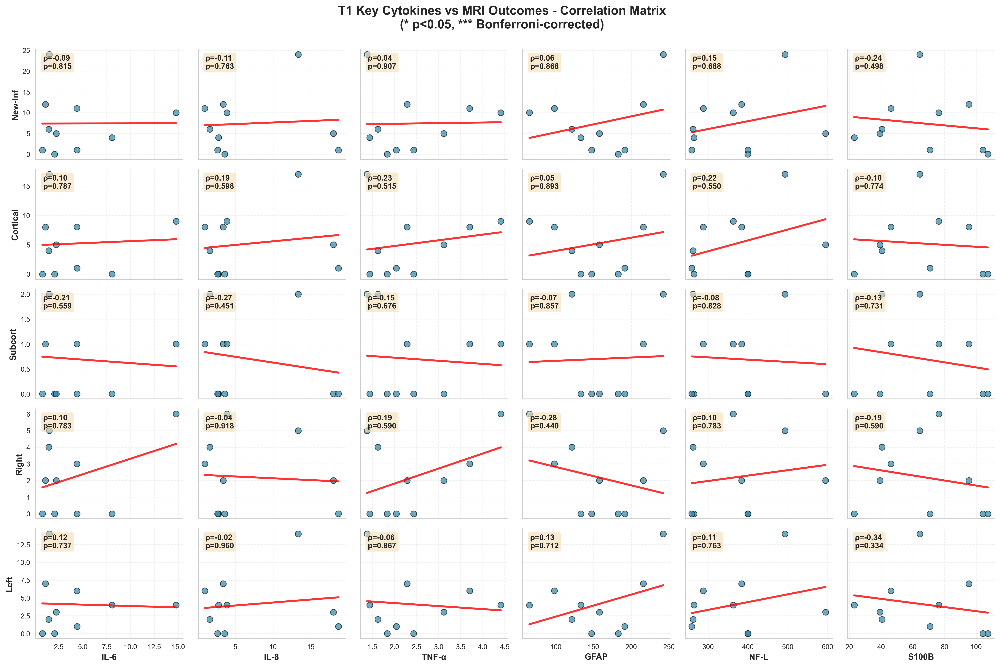


CORRELATION MATRIX PLOTS CREATED
Location: /Users/valar/Documents/Projects/MRI-TAVI-Cytokines/results/Correlation_Plots/

Files created:
  - T1_Cytokines_vs_MRI_Pairs_Plot.png (all variables)
  - T1_Key_Cytokines_vs_MRI_Simplified.png (key variables only)


In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr

# Create a folder for correlation plots
corrplot_path = f"{results_path}/Correlation_Plots"
os.makedirs(corrplot_path, exist_ok=True)

# ============================================================================
# PREPARE DATA FOR T1 CYTOKINES VS MRI OUTCOMES
# ============================================================================

# Select T1 cytokines
t1_cytokines = ['IL-1β_T1', 'IL-2_T1', 'IL-4_T1', 'IL-6_T1', 'IL-8_T1', 
                'IL-10_T1', 'IL-12p70_T1', 'IL-13_T1', 'TNF-α_T1', 'IFN-γ_T1', 
                'GFAP_T1', 'NF-L_T1', 'S100B_T1', 'Tau_T1']

# Select MRI outcomes (use shorter names for display)
mri_outcome_cols = {
    'Fazekas': 'PRE_SVD Fazekas Score (1,2,3)',
    'Pre-Inf': 'PRE_Infarcts - Total Number',
    'New-Inf': 'POST_Number of new acute infarcts',
    'Cortical': 'POST_New supratentorial infarcts - cortical (number)',
    'Subcort': 'POST_New supratentorial infarcts - subcortical (number)',
    'Right': 'POST_New infarcts - Right cerebral hemisphere (number)',
    'Left': 'POST_New infarcts - Left cerebral hemisphere (number)',
    'Cerebel': 'POST_New Infarcts - Cerebellum (number)',
    'Microhem': 'POST_New microhaemorrhage (number)'
}

# Create a combined dataframe with T1 cytokines and MRI outcomes
plot_data = merged_df[['Subject']].copy()

# Add T1 cytokines (remove _T1 suffix for cleaner labels)
for cyt in t1_cytokines:
    if cyt in merged_df.columns:
        clean_name = cyt.replace('_T1', '')
        plot_data[clean_name] = merged_df[cyt]

# Add MRI outcomes
for short_name, full_name in mri_outcome_cols.items():
    if full_name in merged_df.columns:
        plot_data[short_name] = merged_df[full_name]

# Remove Subject column for plotting
plot_data_numeric = plot_data.drop('Subject', axis=1)

print("="*80)
print("CREATING CORRELATION MATRIX PLOT FOR T1 CYTOKINES VS MRI OUTCOMES")
print("="*80)
print(f"Variables: {plot_data_numeric.shape[1]}")
print(f"Samples: {plot_data_numeric.shape[0]}")
print("="*80 + "\n")

# ============================================================================
# CREATE PAIRS PLOT WITH CORRELATION VALUES
# ============================================================================

# Get list of cytokines and MRI outcomes
cytokine_names = [col for col in plot_data_numeric.columns if col not in mri_outcome_cols.keys()]
mri_names = list(mri_outcome_cols.keys())

n_cytokines = len(cytokine_names)
n_mri = len(mri_names)

# Create figure
fig, axes = plt.subplots(n_mri, n_cytokines, figsize=(28, 20))

# Plot each combination
for i, mri_var in enumerate(mri_names):
    for j, cyt_var in enumerate(cytokine_names):
        ax = axes[i, j]
        
        # Get data
        x = plot_data_numeric[cyt_var].values
        y = plot_data_numeric[mri_var].values
        
        # Remove NaN values
        valid_mask = ~(np.isnan(x) | np.isnan(y))
        x_valid = x[valid_mask]
        y_valid = y[valid_mask]
        
        if len(x_valid) >= 3 and x_valid.std() > 0 and y_valid.std() > 0:
            # Scatter plot
            ax.scatter(x_valid, y_valid, alpha=0.6, s=50, color='#2E86AB', edgecolors='black', linewidth=0.5)
            
            # Add regression line
            z = np.polyfit(x_valid, y_valid, 1)
            p = np.poly1d(z)
            x_line = np.linspace(x_valid.min(), x_valid.max(), 100)
            ax.plot(x_line, p(x_line), "r-", linewidth=2, alpha=0.8)
            
            # Calculate Spearman correlation
            rho, p_val = spearmanr(x_valid, y_valid)
            
            # Add text with correlation
            if p_val < 0.001:
                p_text = 'p<0.001'
            else:
                p_text = f'p={p_val:.3f}'
            
            ax.text(0.05, 0.95, f'ρ={rho:.2f}\n{p_text}', 
                   transform=ax.transAxes, fontsize=9, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        else:
            # No valid data or constant
            ax.text(0.5, 0.5, 'N/A', transform=ax.transAxes, 
                   ha='center', va='center', fontsize=12, color='gray')
        
        # Labels only on edges
        if i == n_mri - 1:
            ax.set_xlabel(cyt_var, fontsize=10, fontweight='bold')
        else:
            ax.set_xticklabels([])
        
        if j == 0:
            ax.set_ylabel(mri_var, fontsize=10, fontweight='bold')
        else:
            ax.set_yticklabels([])
        
        # Clean up
        ax.tick_params(labelsize=8)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

plt.suptitle('T1 Cytokines vs MRI Outcomes - Correlation Matrix', 
             fontsize=18, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(f'{corrplot_path}/T1_Cytokines_vs_MRI_Pairs_Plot.png', dpi=300, bbox_inches='tight')
print(f"Saved: {corrplot_path}/T1_Cytokines_vs_MRI_Pairs_Plot.png")
plt.show()

# ============================================================================
# ALTERNATIVE: SIMPLIFIED VERSION (FEWER VARIABLES FOR CLARITY)
# ============================================================================

# Select top cytokines and outcomes for cleaner plot
top_cytokines = ['IL-6', 'IL-8', 'TNF-α', 'GFAP', 'NF-L', 'S100B']
top_mri = ['New-Inf', 'Cortical', 'Subcort', 'Right', 'Left']

# Create subset
plot_subset = plot_data_numeric[top_cytokines + top_mri]

n_cyt_sub = len(top_cytokines)
n_mri_sub = len(top_mri)

# Create figure
fig2, axes2 = plt.subplots(n_mri_sub, n_cyt_sub, figsize=(18, 12))

for i, mri_var in enumerate(top_mri):
    for j, cyt_var in enumerate(top_cytokines):
        ax = axes2[i, j]
        
        # Get data
        x = plot_subset[cyt_var].values
        y = plot_subset[mri_var].values
        
        # Remove NaN values
        valid_mask = ~(np.isnan(x) | np.isnan(y))
        x_valid = x[valid_mask]
        y_valid = y[valid_mask]
        
        if len(x_valid) >= 3 and x_valid.std() > 0 and y_valid.std() > 0:
            # Scatter plot
            ax.scatter(x_valid, y_valid, alpha=0.7, s=60, color='#2E86AB', edgecolors='black', linewidth=0.8)
            
            # Add regression line
            z = np.polyfit(x_valid, y_valid, 1)
            p = np.poly1d(z)
            x_line = np.linspace(x_valid.min(), x_valid.max(), 100)
            ax.plot(x_line, p(x_line), "r-", linewidth=2.5, alpha=0.8)
            
            # Calculate Spearman correlation
            rho, p_val = spearmanr(x_valid, y_valid)
            
            # Determine significance
            bonf_alpha = 0.05 / (n_cyt_sub * n_mri_sub)
            if p_val < bonf_alpha:
                sig = '***'
            elif p_val < 0.05:
                sig = '*'
            else:
                sig = ''
            
            # Add text with correlation
            if p_val < 0.001:
                p_text = 'p<0.001'
            else:
                p_text = f'p={p_val:.3f}'
            
            ax.text(0.05, 0.95, f'ρ={rho:.2f}{sig}\n{p_text}', 
                   transform=ax.transAxes, fontsize=10, verticalalignment='top',
                   fontweight='bold',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.6))
        else:
            ax.text(0.5, 0.5, 'N/A', transform=ax.transAxes, 
                   ha='center', va='center', fontsize=12, color='gray')
        
        # Labels
        if i == n_mri_sub - 1:
            ax.set_xlabel(cyt_var, fontsize=11, fontweight='bold')
        else:
            ax.set_xticklabels([])
        
        if j == 0:
            ax.set_ylabel(mri_var, fontsize=11, fontweight='bold')
        else:
            ax.set_yticklabels([])
        
        ax.tick_params(labelsize=9)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(alpha=0.3, linestyle='--')

plt.suptitle('T1 Key Cytokines vs MRI Outcomes - Correlation Matrix\n(* p<0.05, *** Bonferroni-corrected)', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(f'{corrplot_path}/T1_Key_Cytokines_vs_MRI_Simplified.png', dpi=300, bbox_inches='tight')
print(f"Saved: {corrplot_path}/T1_Key_Cytokines_vs_MRI_Simplified.png")
plt.show()

print("\n" + "="*80)
print("CORRELATION MATRIX PLOTS CREATED")
print("="*80)
print(f"Location: {corrplot_path}/")
print("\nFiles created:")
print("  - T1_Cytokines_vs_MRI_Pairs_Plot.png (all variables)")
print("  - T1_Key_Cytokines_vs_MRI_Simplified.png (key variables only)")